<a href="https://colab.research.google.com/github/ataev2808/ml_models/blob/main/UNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install opencv-python

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from tqdm import tqdm
import logging
import time
from torch.amp import GradScaler, autocast  # Обновлённый импорт

# Настройка логирования
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.FileHandler('training_log.txt'),
        logging.StreamHandler()
    ]
)
logger = logging.getLogger(__name__)

# Класс датасета CASIA-FASD
class CASIAFASDDataset(Dataset):
    def __init__(self, rgb_paths, depth_paths):
        self.rgb_paths = rgb_paths
        self.depth_paths = depth_paths
        logger.info(f"Инициализирован датасет с {len(rgb_paths)} RGB и {len(depth_paths)} изображениями глубины")

    def __len__(self):
        return len(self.rgb_paths)

    def __getitem__(self, idx):
        # Загрузка и предобработка RGB
        rgb = cv2.imread(self.rgb_paths[idx])
        if rgb is None:
            logger.error(f"Не удалось загрузить RGB-изображение: {self.rgb_paths[idx]}")
            raise FileNotFoundError(self.rgb_paths[idx])
        rgb = rgb / 255.0  # Нормализация [0, 1]
        rgb = torch.tensor(rgb.transpose(2, 0, 1), dtype=torch.float32)

        # Загрузка и предобработка глубины
        depth = cv2.imread(self.depth_paths[idx], cv2.IMREAD_GRAYSCALE)
        if depth is None:
            logger.error(f"Не удалось загрузить изображение глубины: {self.depth_paths[idx]}")
            raise FileNotFoundError(self.depth_paths[idx])
        depth = depth.astype(np.float32) / 255.0  # Нормализация [0, 1]
        depth = torch.tensor(depth[None, :, :], dtype=torch.float32)

        # Метка real/spoof
        spoof_label = 0 if 'real' in os.path.basename(self.rgb_paths[idx]).lower() else 1
        spoof_label = torch.tensor(spoof_label, dtype=torch.float32)

        return rgb, depth, spoof_label

# Архитектура U-Net
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        # Энкодер
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(3, 64)  # 256x256x64
        self.enc2 = conv_block(64, 128)  # 128x128x128
        self.enc3 = conv_block(128, 256)  # 64x64x256
        self.enc4 = conv_block(256, 512)  # 32x32x512
        self.enc5 = conv_block(512, 1024)  # 16x16x1024 (бутылочное горлышко)

        self.pool = nn.MaxPool2d(2, 2)

        # Декодер
        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = conv_block(1024, 512)  # Конкатенация: 512+512
        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.out = nn.Conv2d(64, 1, 1)  # Выход: 256x256x1 (глубина)
        logger.info("Инициализирована модель U-Net")

    def forward(self, x):
        # Энкодер
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        e5 = self.enc5(self.pool(e4))

        # Декодер
        d4 = self.upconv4(e5)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)
        d3 = self.upconv3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)
        d2 = self.upconv2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)
        d1 = self.upconv1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        depth = self.out(d1)
        return depth

# Подготовка данных
def prepare_data(data_dir):
    logger.info(f"Подготовка данных из директории: {data_dir}")
    start_time = time.time()
    # Загрузка путей к файлам
    train_rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'color', '*.jpg')))
    train_depth_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'depth', '*.jpg')))
    test_rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'test_img', 'color', '*.jpg')))
    test_depth_paths = sorted(glob.glob(os.path.join(data_dir, 'test_img', 'depth', '*.jpg')))

    # Проверка соответствия
    if len(train_rgb_paths) != len(train_depth_paths):
        logger.error(f"Несоответствие в обучающих данных: {len(train_rgb_paths)} RGB vs {len(train_depth_paths)} глубина")
        raise ValueError("Несоответствие в обучающих данных")
    if len(test_rgb_paths) != len(test_depth_paths):
        logger.error(f"Несоответствие в тестовых данных: {len(test_rgb_paths)} RGB vs {len(test_depth_paths)} глубина")
        raise ValueError("Несоответствие в тестовых данных")

    logger.info(f"Загружено {len(train_rgb_paths)} обучающих и {len(test_rgb_paths)} тестовых образцов")

    # Валидационная выборка (15% от train)
    n_train = len(train_rgb_paths)
    indices = np.random.permutation(n_train)
    train_idx = indices[:int(0.85 * n_train)]
    val_idx = indices[int(0.85 * n_train):]

    train_rgb = [train_rgb_paths[i] for i in train_idx]
    train_depth = [train_depth_paths[i] for i in train_idx]
    val_rgb = [train_rgb_paths[i] for i in val_idx]
    val_depth = [train_depth_paths[i] for i in val_idx]

    logger.info(f"Разделение данных: {len(train_rgb)} обучение, {len(val_rgb)} валидация, {len(test_rgb_paths)} тест")
    logger.info(f"Подготовка данных заняла {time.time() - start_time:.2f} секунд")

    return (train_rgb, train_depth), (val_rgb, val_depth), (test_rgb_paths, test_depth_paths)

# Основной цикл обучения
def train_model(data_dir, num_epochs=20):
    logger.info("Начало процесса обучения")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    logger.info(f"Используемое устройство: {device}")
    if torch.cuda.is_available():
        logger.info(f"GPU: {torch.cuda.get_device_name(0)}")

    # Подготовка данных
    logger.info("Загрузка датасетов")
    start_time = time.time()
    (train_rgb, train_depth), (val_rgb, val_depth), (test_rgb, test_depth) = prepare_data(data_dir)
    train_dataset = CASIAFASDDataset(train_rgb, train_depth)
    val_dataset = CASIAFASDDataset(val_rgb, val_depth)
    test_dataset = CASIAFASDDataset(test_rgb, test_depth)

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=32, num_workers=4, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=32, num_workers=4, pin_memory=True)
    logger.info(f"DataLoader создан, заняло {time.time() - start_time:.2f} секунд")

    # Модель, потеря, оптимизатор
    model = UNet().to(device)
    criterion_depth = nn.L1Loss()  # MAE
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    scaler = GradScaler()  # Для смешанной точности
    logger.info("Модель, функция потерь и оптимизатор инициализированы")

    # Для сохранения лучшей модели
    best_val_mae = float('inf')
    best_model_path = "unet_depth_casia_fasd_best.pth"

    # Для графика
    train_maes, val_maes = [], []

    # Обучение
    logger.info(f"Начало обучения на {num_epochs} эпох")
    total_start_time = time.time()
    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        logger.info(f"Эпоха {epoch + 1}/{num_epochs} начата")

        # Тренировка
        model.train()
        train_mae = 0
        for batch_idx, (rgb, depth, _) in enumerate(tqdm(train_loader, desc=f"Эпоха {epoch + 1} Обучение")):
            rgb, depth = rgb.to(device, non_blocking=True), depth.to(device, non_blocking=True)
            if batch_idx == 0:
                logger.info(f"Размер батча: RGB {rgb.shape}, Глубина {depth.shape}")
            optimizer.zero_grad()
            with torch.amp.autocast('cuda'):  # Обновлённый autocast
                depth_pred = model(rgb)
                loss = criterion_depth(depth_pred, depth)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            train_mae += loss.item() * rgb.size(0)

        train_mae /= len(train_dataset)
        train_maes.append(train_mae)
        logger.info(f"Эпоха {epoch + 1} обучающая MAE: {train_mae:.4f}")

        # Валидация
        model.eval()
        val_mae = 0
        with torch.no_grad():
            for rgb, depth, _ in tqdm(val_loader, desc=f"Эпоха {epoch + 1} Валидация"):
                rgb, depth = rgb.to(device, non_blocking=True), depth.to(device, non_blocking=True)
                with torch.amp.autocast('cuda'):  # Обновлённый autocast
                    depth_pred = model(rgb)
                    loss = criterion_depth(depth_pred, depth)
                val_mae += loss.item() * rgb.size(0)

        val_mae /= len(val_dataset)
        val_maes.append(val_mae)
        logger.info(f"Эпоха {epoch + 1} валидационная MAE: {val_mae:.4f}")

        # Сохранение лучшей модели
        if val_mae < best_val_mae:
            best_val_mae = val_mae
            torch.save(model.state_dict(), best_model_path)
            logger.info(f"Сохранена лучшая модель с Val MAE: {val_mae:.4f} в {best_model_path}")

        epoch_time = time.time() - epoch_start_time
        logger.info(f"Эпоха {epoch + 1} завершена за {epoch_time:.2f} секунд")

    total_time = time.time() - total_start_time
    logger.info(f"Обучение завершено за {total_time:.2f} секунд")

    # Построение графика MAE
    logger.info("Генерация графика MAE")
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_maes, label='Обучающая MAE')
    plt.plot(range(1, num_epochs + 1), val_maes, label='Валидационная MAE')
    plt.xlabel('Эпоха')
    plt.ylabel('MAE')
    plt.title('MAE по эпохам')
    plt.legend()
    plt.grid(True)
    plt.savefig('mae_plot.png')
    plt.show()

    # Тестирование
    logger.info("Начало тестирования")
    test_start_time = time.time()
    model.load_state_dict(torch.load(best_model_path))
    model.eval()
    test_mae = 0
    test_batch_maes = []
    last_real_rgb, last_real_depth_true, last_real_depth_pred = None, None, None
    last_spoof_rgb, last_spoof_depth_true, last_spoof_depth_pred = None, None, None
    with torch.no_grad():
        for rgb, depth, spoof_label in tqdm(test_loader, desc="Тестирование"):
            rgb, depth, spoof_label = rgb.to(device, non_blocking=True), depth.to(device, non_blocking=True), spoof_label.to(device, non_blocking=True)
            with torch.amp.autocast('cuda'):  # Обновлённый autocast
                depth_pred = model(rgb)
                loss = criterion_depth(depth_pred, depth)
            test_mae += loss.item() * rgb.size(0)
            batch_mae = loss.item()
            test_batch_maes.append(batch_mae)
            # Сохранение последнего real и spoof
            if spoof_label[-1].item() == 0:  # Real
                last_real_rgb = rgb[-1].cpu().numpy().transpose(1, 2, 0)
                last_real_depth_true = depth[-1].cpu().numpy().squeeze()
                last_real_depth_pred = depth_pred[-1].cpu().numpy().squeeze()
            else:  # Spoof
                last_spoof_rgb = rgb[-1].cpu().numpy().transpose(1, 2, 0)
                last_spoof_depth_true = depth[-1].cpu().numpy().squeeze()
                last_spoof_depth_pred = depth_pred[-1].cpu().numpy().squeeze()

    test_mae /= len(test_dataset)
    logger.info(f"Тестовая MAE: {test_mae:.4f}")
    test_time = time.time() - test_start_time
    logger.info(f"Тестирование завершено за {test_time:.2f} секунд")

    # Вывод минимальных и максимальных значений
    if last_real_depth_true is not None and last_real_depth_pred is not None:
        logger.info(f"Min/Max True Depth (Real): {last_real_depth_true.min():.4f}/{last_real_depth_true.max():.4f}")
        logger.info(f"Min/Max Predicted Depth (Real): {last_real_depth_pred.min():.4f}/{last_real_depth_pred.max():.4f}")
    if last_spoof_depth_true is not None and last_spoof_depth_pred is not None:
        logger.info(f"Min/Max True Depth (Spoof): {last_spoof_depth_true.min():.4f}/{last_spoof_depth_true.max():.4f}")
        logger.info(f"Min/Max Predicted Depth (Spoof): {last_spoof_depth_pred.min():.4f}/{last_spoof_depth_pred.max():.4f}")

    # Визуализация для real и spoof
    logger.info("Генерация графика сравнения глубины для real и spoof")
    plt.figure(figsize=(15, 10))
    # Real
    if last_real_rgb is not None:
        plt.subplot(2, 3, 1)
        plt.imshow(last_real_rgb)
        plt.title('Real RGB Input')
        plt.axis('off')
        plt.subplot(2, 3, 2)
        plt.imshow(last_real_depth_true, cmap='gray')
        plt.title('Real True Depth')
        plt.axis('off')
        plt.subplot(2, 3, 3)
        plt.imshow(last_real_depth_pred, cmap='gray')
        plt.title('Real Predicted Depth')
        plt.axis('off')
    else:
        logger.warning("Нет real-изображений в тестовой выборке")
    # Spoof
    if last_spoof_rgb is not None:
        plt.subplot(2, 3, 4)
        plt.imshow(last_spoof_rgb)
        plt.title('Spoof RGB Input')
        plt.axis('off')
        plt.subplot(2, 3, 5)
        plt.imshow(last_spoof_depth_true, cmap='gray')
        plt.title('Spoof True Depth')
        plt.axis('off')
        plt.subplot(2, 3, 6)
        plt.imshow(last_spoof_depth_pred, cmap='gray')
        plt.title('Spoof Predicted Depth')
        plt.axis('off')
    else:
        logger.warning("Нет spoof-изображений в тестовой выборке")
    plt.savefig('depth_comparison_real_spoof.png')
    plt.show()

    # График накопительного MAE
    logger.info("Генерация графика накопительного MAE для тестирования")
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(test_batch_maes) + 1), np.cumsum(test_batch_maes) / np.arange(1, len(test_batch_maes) + 1), label='Накопительная тестовая MAE')
    plt.xlabel('Номер батча')
    plt.ylabel('Накопительная MAE')
    plt.title('Накопительная MAE во время тестирования')
    plt.legend()
    plt.grid(True)
    plt.savefig('test_mae_plot.png')
    plt.show()

    # Сохранение финальной модели
    final_model_path = "unet_depth_casia_fasd_final.pth"
    torch.save(model.state_dict(), final_model_path)
    logger.info(f"Сохранена финальная модель в {final_model_path}")

    return model

if __name__ == "__main__":
    data_dir = "/content/drive/MyDrive/CASIA-FASD"  # Укажите путь к датасету
    logger.info(f"Скрипт запущен с data_dir: {data_dir}")
    model = train_model(data_dir, num_epochs=20)
    logger.info("Скрипт завершён")

RGB Path: /content/drive/MyDrive/CASIA-FASD/train_img/color/10_1.avi_100_real.jpg
Depth Path: /content/drive/MyDrive/CASIA-FASD/train_img/depth/10_1.avi_100_real.jpg

RGB (Shape: torch.Size([3, 256, 256])) (First 30x30 pixels):
[[[0.80784315 0.7921569  0.78431374 ... 0.7882353  0.78431374 0.78431374]
  [0.8117647  0.8        0.7921569  ... 0.79607844 0.7921569  0.7921569 ]
  [0.81960785 0.8117647  0.8039216  ... 0.8039216  0.8        0.8       ]
  ...
  [0.84705883 0.8627451  0.8745098  ... 0.8509804  0.8509804  0.8509804 ]
  [0.8627451  0.8745098  0.8784314  ... 0.85490197 0.85490197 0.85490197]
  [0.87058824 0.8745098  0.8784314  ... 0.85490197 0.85490197 0.85882354]]

 [[0.79607844 0.78039217 0.77254903 ... 0.7764706  0.77254903 0.77254903]
  [0.8        0.7882353  0.78039217 ... 0.78431374 0.78039217 0.78039217]
  [0.80784315 0.8        0.7921569  ... 0.7921569  0.7882353  0.7882353 ]
  ...
  [0.8352941  0.8509804  0.85882354 ... 0.8392157  0.8392157  0.8392157 ]
  [0.8509804  0.86

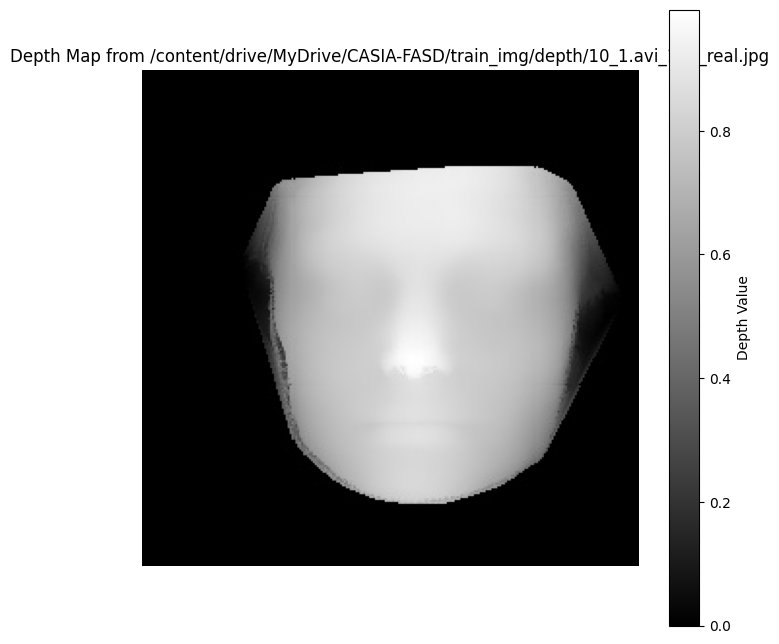

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt

# Функция для загрузки и нормализации данных
def load_and_normalize_pair(data_dir):
    # Загрузка путей к файлам
    rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'color', '*.jpg')))
    depth_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'depth', '*.jpg')))
    assert len(rgb_paths) > 0 and len(depth_paths) > 0, "No data found in directory"
    assert len(rgb_paths) == len(depth_paths), "Mismatch in RGB and depth data"

    # Берем первую пару
    rgb_path = rgb_paths[0]
    depth_path = depth_paths[0]

    # Загрузка и нормализация RGB
    rgb = cv2.imread(rgb_path)
    rgb = rgb / 255.0  # Нормализация [0, 1]
    rgb = torch.tensor(rgb.transpose(2, 0, 1), dtype=torch.float32)

    # Загрузка и нормализация глубины
    depth = cv2.imread(depth_path, cv2.IMREAD_GRAYSCALE)
    depth = depth.astype(np.float32) / 255.0  # Нормализация [0, 1]
    depth = torch.tensor(depth[None, :, :], dtype=torch.float32)

    return rgb, depth, rgb_path, depth_path

# Функция для вывода матрицы (только фрагмент 30x30)
def print_matrix(tensor, title):
    print(f"\n{title} (First 30x30 pixels):")
    print(tensor[:, :30, :30].numpy())  # Выводим только первые 30x30 пикселей

# Функция для сохранения полной матрицы в файл (опционально)
def save_matrix_to_file(tensor, filename):
    np.savetxt(filename, tensor.numpy().flatten(), fmt='%.4f')
    print(f"Full matrix saved to {filename}")

# Функция для визуализации карты глубины
def visualize_depth_matrix(depth_matrix, title="Depth Map", save_path="depth_map.png"):
    # Преобразуем в 2D-матрицу, если есть лишняя размерность
    if depth_matrix.ndim == 3 and depth_matrix.shape[0] == 1:
        depth_matrix = depth_matrix.squeeze()
    elif depth_matrix.ndim != 2:
        raise ValueError("Depth matrix must be 2D or have shape (1, height, width)")

    # Визуализация
    plt.figure(figsize=(8, 8))
    plt.imshow(depth_matrix, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.colorbar(label='Depth Value')
    plt.savefig(save_path)
    plt.show()

# Основной код
if __name__ == "__main__":
    data_dir = "/content/drive/MyDrive/CASIA-FASD"  # Укажите путь к датасету
    rgb, depth, rgb_path, depth_path = load_and_normalize_pair(data_dir)

    # Вывод информации о путях
    print(f"RGB Path: {rgb_path}")
    print(f"Depth Path: {depth_path}")

    # Вывод фрагмента матриц
    print_matrix(rgb, f"RGB (Shape: {rgb.shape})")
    print_matrix(depth, f"Depth (Shape: {depth.shape})")

    # Проверка минимальных и максимальных значений
    print(f"\nMin/Max RGB: {rgb.min().item():.4f}/{rgb.max().item():.4f}")
    print(f"Min/Max Depth: {depth.min().item():.4f}/{depth.max().item():.4f}")

    # Сохранение полной матрицы (опционально)
    save_matrix_to_file(rgb, "rgb_matrix.txt")
    save_matrix_to_file(depth, "depth_matrix.txt")

    # Преобразование и визуализация карты глубины
    visualize_depth_matrix(depth, f"Depth Map from {depth_path}")

Epoch 1/10, Train MSE: 0.0619
Epoch 2/10, Train MSE: 0.0556
Epoch 3/10, Train MSE: 0.0556
Epoch 4/10, Train MSE: 0.0556
Epoch 5/10, Train MSE: 0.0556
Epoch 6/10, Train MSE: 0.0556
Epoch 7/10, Train MSE: 0.0556
Epoch 8/10, Train MSE: 0.0556
Epoch 9/10, Train MSE: 0.0556
Epoch 10/10, Train MSE: 0.0556
Test MSE: 0.0564


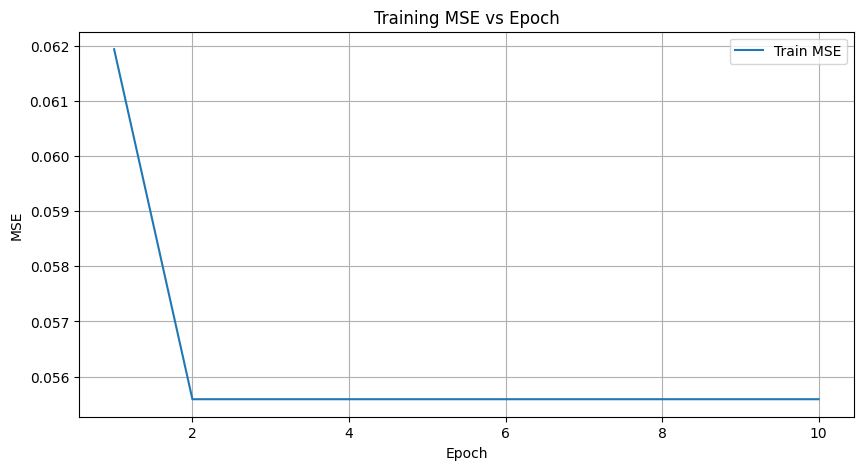

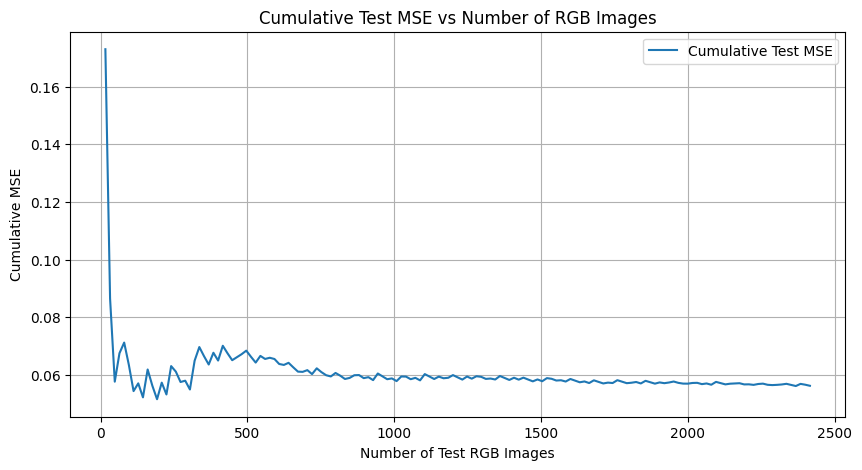

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from torch.amp import GradScaler, autocast

# Датасет
class CASIAFASDDataset(Dataset):
    def __init__(self, rgb_paths, depth_paths):
        self.rgb_paths = rgb_paths
        self.depth_paths = depth_paths

    def __len__(self):
        return len(self.rgb_paths)

    def __getitem__(self, idx):
        rgb = cv2.imread(self.rgb_paths[idx])
        rgb = rgb / 255.0
        rgb = torch.tensor(rgb.transpose(2, 0, 1), dtype=torch.float32)
        depth = cv2.imread(self.depth_paths[idx], cv2.IMREAD_GRAYSCALE)
        depth = depth.astype(np.float32) / 255.0
        depth = torch.tensor(depth[None, :, :], dtype=torch.float32)
        return rgb, depth

# U-Net
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True)
            )
        self.enc1 = conv_block(3, 64)
        self.pool = nn.MaxPool2d(2, 2)
        self.enc2 = conv_block(64, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = conv_block(128, 64)
        self.out = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        d1 = self.upconv1(e2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)
        return torch.sigmoid(self.out(d1))

# Подготовка данных
def prepare_data(data_dir):
    rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'color', '*.jpg')))
    depth_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'depth', '*.jpg')))
    test_rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'test_img', 'color', '*.jpg')))
    test_depth_paths = sorted(glob.glob(os.path.join(data_dir, 'test_img', 'depth', '*.jpg')))
    assert len(rgb_paths) == len(depth_paths), "Mismatch in train data"
    assert len(test_rgb_paths) == len(test_depth_paths), "Mismatch in test data"
    return (rgb_paths, depth_paths), (test_rgb_paths, test_depth_paths)

# Обучение
def train_model(data_dir, num_epochs=10):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    (train_rgb, train_depth), (test_rgb, test_depth) = prepare_data(data_dir)
    train_dataset = CASIAFASDDataset(train_rgb, train_depth)
    test_dataset = CASIAFASDDataset(test_rgb, test_depth)
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=16, num_workers=4, pin_memory=True)

    model = UNet().to(device)
    criterion = nn.MSELoss()  # Используем MSE как функцию потерь
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    scaler = GradScaler()

    # Для графиков
    train_mses = []
    test_mses = []

    # Обучение
    for epoch in range(num_epochs):
        model.train()
        train_mse = 0
        for rgb, depth in train_loader:
            rgb, depth = rgb.to(device, non_blocking=True), depth.to(device, non_blocking=True)
            optimizer.zero_grad()
            with autocast(device_type=device.type):  # Указываем device_type
                pred = model(rgb)
                loss = criterion(pred, depth)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            train_mse += loss.item() * rgb.size(0)
        train_mse /= len(train_dataset)
        train_mses.append(train_mse)
        print(f"Epoch {epoch + 1}/{num_epochs}, Train MSE: {train_mse:.4f}")

    # Тестирование
    model.eval()
    test_mse = 0
    test_batch_mses = []
    with torch.no_grad():
        for i, (rgb, depth) in enumerate(test_loader):
            rgb, depth = rgb.to(device, non_blocking=True), depth.to(device, non_blocking=True)
            with autocast(device_type=device.type):  # Указываем device_type
                pred = model(rgb)
                loss = criterion(pred, depth)
            test_mse += loss.item() * rgb.size(0)
            batch_mse = loss.item()
            test_batch_mses.append(batch_mse)

    test_mse /= len(test_dataset)
    test_mses.append(test_mse)
    print(f"Test MSE: {test_mse:.4f}")

    # График MSE на обучающей выборке
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_mses, label='Train MSE')
    plt.xlabel('Epoch')
    plt.ylabel('MSE')
    plt.title('Training MSE vs Epoch')
    plt.legend()
    plt.grid(True)
    plt.savefig('train_mse_plot.png')
    plt.show()

    # График MSE относительно количества RGB изображений в тестовой выборке
    test_image_count = np.arange(1, len(test_batch_mses) + 1) * 16  # Учитываем размер батча
    cumulative_test_mse = np.cumsum(test_batch_mses) / np.arange(1, len(test_batch_mses) + 1)
    plt.figure(figsize=(10, 5))
    plt.plot(test_image_count, cumulative_test_mse, label='Cumulative Test MSE')
    plt.xlabel('Number of Test RGB Images')
    plt.ylabel('Cumulative MSE')
    plt.title('Cumulative Test MSE vs Number of RGB Images')
    plt.legend()
    plt.grid(True)
    plt.savefig('test_mse_plot.png')
    plt.show()

    torch.save(model.state_dict(), "unet_depth_model.pth")

if __name__ == "__main__":
    data_dir = "/content/drive/MyDrive/CASIA-FASD"
    train_model(data_dir)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt


# Класс датасета CASIA-FASD
class CASIAFASDDataset(Dataset):
    def __init__(self, rgb_paths, depth_paths):
        self.rgb_paths = rgb_paths
        self.depth_paths = depth_paths

    def __len__(self):
        return len(self.rgb_paths)

    def __getitem__(self, idx):
        # Загрузка и предобработка RGB
        rgb = cv2.imread(self.rgb_paths[idx])
        rgb = rgb / 255.0  # Нормализация [0, 1]
        rgb = torch.tensor(rgb.transpose(2, 0, 1), dtype=torch.float32)

        # Загрузка и предобработка глубины
        depth = cv2.imread(self.depth_paths[idx], cv2.IMREAD_GRAYSCALE)
        depth = depth.astype(np.float32) / 255.0  # Нормализация [0, 1]
        depth = torch.tensor(depth[None, :, :], dtype=torch.float32)

        return rgb, depth


# Архитектура U-Net
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        # Энкодер
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(3, 64)  # 256x256x64
        self.enc2 = conv_block(64, 128)  # 128x128x128
        self.enc3 = conv_block(128, 256)  # 64x64x256
        self.enc4 = conv_block(256, 512)  # 32x32x512
        self.enc5 = conv_block(512, 1024)  # 16x16x1024 (бутылочное горлышко)

        self.pool = nn.MaxPool2d(2, 2)

        # Декодер
        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = conv_block(1024, 512)  # Конкатенация: 512+512
        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.out = nn.Conv2d(64, 1, 1)  # Выход: 256x256x1 (глубина)

    def forward(self, x):
        # Энкодер
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        e5 = self.enc5(self.pool(e4))

        # Декодер
        d4 = self.upconv4(e5)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)
        d3 = self.upconv3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)
        d2 = self.upconv2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)
        d1 = self.upconv1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        depth = self.out(d1)
        return depth


# Подготовка данных
def prepare_data(data_dir):
    # Загрузка путей к файлам
    train_rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'color', '*.jpg')))
    train_depth_paths = sorted(glob.glob(os.path.join(data_dir, 'train_img', 'depth', '*.jpg')))
    test_rgb_paths = sorted(glob.glob(os.path.join(data_dir, 'test_img', 'color', '*.jpg')))
    test_depth_paths = sorted(glob.glob(os.path.join(data_dir, 'test_img', 'depth', '*.jpg')))

    # Проверка соответствия
    assert len(train_rgb_paths) == len(train_depth_paths), "Mismatch in train data"
    assert len(test_rgb_paths) == len(test_depth_paths), "Mismatch in test data"

    # Валидационная выборка (15% от train)
    n_train = len(train_rgb_paths)
    indices = np.random.permutation(n_train)
    train_idx = indices[:int(0.85 * n_train)]
    val_idx = indices[int(0.85 * n_train):]

    train_rgb = [train_rgb_paths[i] for i in train_idx]
    train_depth = [train_depth_paths[i] for i in train_idx]
    val_rgb = [train_rgb_paths[i] for i in val_idx]
    val_depth = [train_depth_paths[i] for i in val_idx]

    return (train_rgb, train_depth), (val_rgb, val_depth), (test_rgb_paths, test_depth_paths)


# Основной цикл обучения
def train_model(data_dir, num_epochs=20):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Подготовка данных
    (train_rgb, train_depth), (val_rgb, val_depth), (test_rgb, test_depth) = prepare_data(data_dir)
    train_dataset = CASIAFASDDataset(train_rgb, train_depth)
    val_dataset = CASIAFASDDataset(val_rgb, val_depth)
    test_dataset = CASIAFASDDataset(test_rgb, test_depth)

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32)
    test_loader = DataLoader(test_dataset, batch_size=32)

    # Модель, потеря, оптимизатор
    model = UNet().to(device)
    criterion_depth = nn.L1Loss()  # MAE
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Для сохранения лучшей модели
    best_val_mae = float('inf')
    best_model_path = "unet_depth_casia_fasd_best.pth"

    # Для графика
    train_maes, val_maes = [], []

    # Обучение
    for epoch in range(num_epochs):
        model.train()
        train_mae = 0
        for rgb, depth in train_loader:
            rgb, depth = rgb.to(device), depth.to(device)
            optimizer.zero_grad()
            depth_pred = model(rgb)
            loss = criterion_depth(depth_pred, depth)
            loss.backward()
            optimizer.step()
            train_mae += loss.item() * rgb.size(0)  # Умножаем на размер батча

        train_mae /= len(train_dataset)
        train_maes.append(train_mae)

        # Валидация
        model.eval()
        val_mae = 0
        with torch.no_grad():
            for rgb, depth in val_loader:
                rgb, depth = rgb.to(device), depth.to(device)
                depth_pred = model(rgb)
                loss = criterion_depth(depth_pred, depth)
                val_mae += loss.item() * rgb.size(0)

        val_mae /= len(val_dataset)
        val_maes.append(val_mae)

        # Сохранение лучшей модели
        if val_mae < best_val_mae:
            best_val_mae = val_mae
            torch.save(model.state_dict(), best_model_path)
            print(f"Saved best model with Val MAE: {val_mae:.4f}")

        print(f"Epoch {epoch + 1}/{num_epochs}, Train MAE: {train_mae:.4f}, Val MAE: {val_mae:.4f}")

    # Построение графика MAE
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_maes, label='Train MAE')
    plt.plot(range(1, num_epochs + 1), val_maes, label='Val MAE')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.title('MAE vs Epoch')
    plt.legend()
    plt.grid(True)
    plt.savefig('mae_plot.png')
    plt.show()

    # Тестирование
    model.load_state_dict(torch.load(best_model_path))  # Загружаем лучшую модель
    model.eval()
    test_mae = 0
    last_depth_pred, last_depth_true, last_rgb = None, None, None
    with torch.no_grad():
        for rgb, depth in test_loader:
            rgb, depth = rgb.to(device), depth.to(device)
            depth_pred = model(rgb)
            loss = criterion_depth(depth_pred, depth)
            test_mae += loss.item() * rgb.size(0)
            last_depth_pred = depth_pred[-1].cpu().numpy().squeeze()  # Последняя предсказанная
            last_depth_true = depth[-1].cpu().numpy().squeeze()  # Последняя истинная
            last_rgb = rgb[-1].cpu().numpy().transpose(1, 2, 0)  # Последняя RGB

    test_mae /= len(test_dataset)
    print(f"Test MAE: {test_mae:.4f}")

    # Визуализация последней пары
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(last_rgb)
    plt.title('RGB Input')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(last_depth_true, cmap='gray')
    plt.title('True Depth')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(last_depth_pred, cmap='gray')
    plt.title('Predicted Depth')
    plt.axis('off')
    plt.savefig('depth_comparison.png')
    plt.show()

    # Сохранение финальной модели
    torch.save(model.state_dict(), "unet_depth_casia_fasd_final.pth")
    return model


if __name__ == "__main__":
    data_dir = "/content/drive/MyDrive/CASIA-FASD"  # Укажите путь к датасету
    model = train_model(data_dir, num_epochs=20)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 34.2MB/s]
Epoch 1: 100%|██████████| 207/207 [07:46<00:00,  2.25s/it]


Epoch 1 - Loss: 0.1436  Precision: 0.9043  Recall: 0.8886


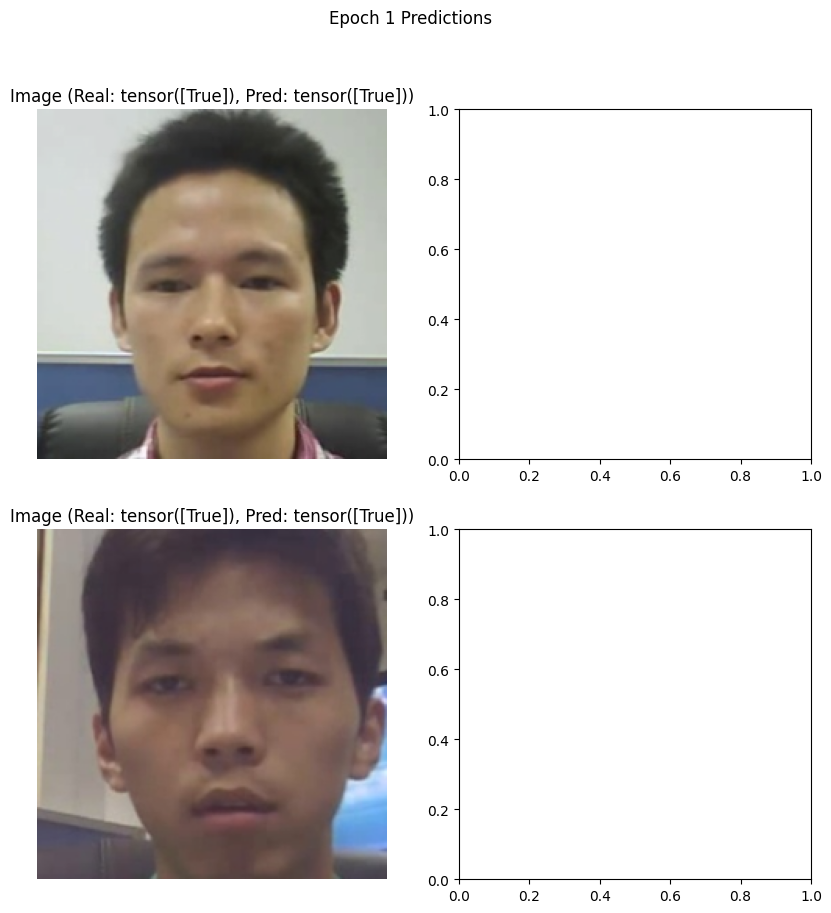

Epoch 2: 100%|██████████| 207/207 [06:58<00:00,  2.02s/it]


Epoch 2 - Loss: 0.0408  Precision: 0.9704  Recall: 0.9728


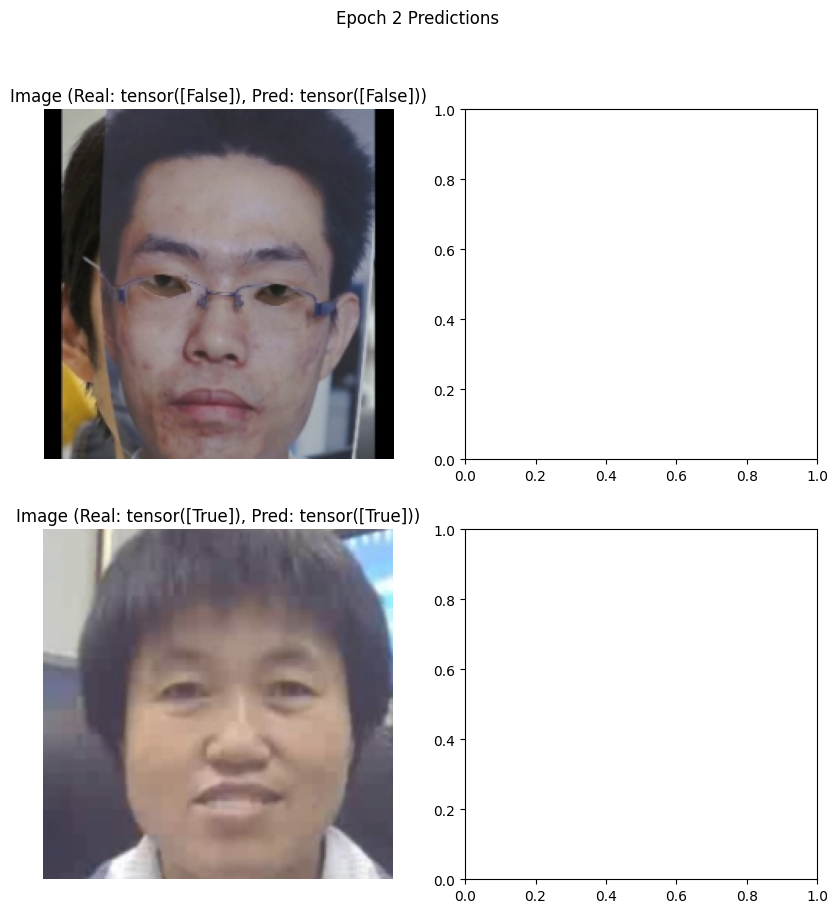

Epoch 3: 100%|██████████| 207/207 [06:58<00:00,  2.02s/it]


Epoch 3 - Loss: 0.0177  Precision: 0.9925  Recall: 0.9876


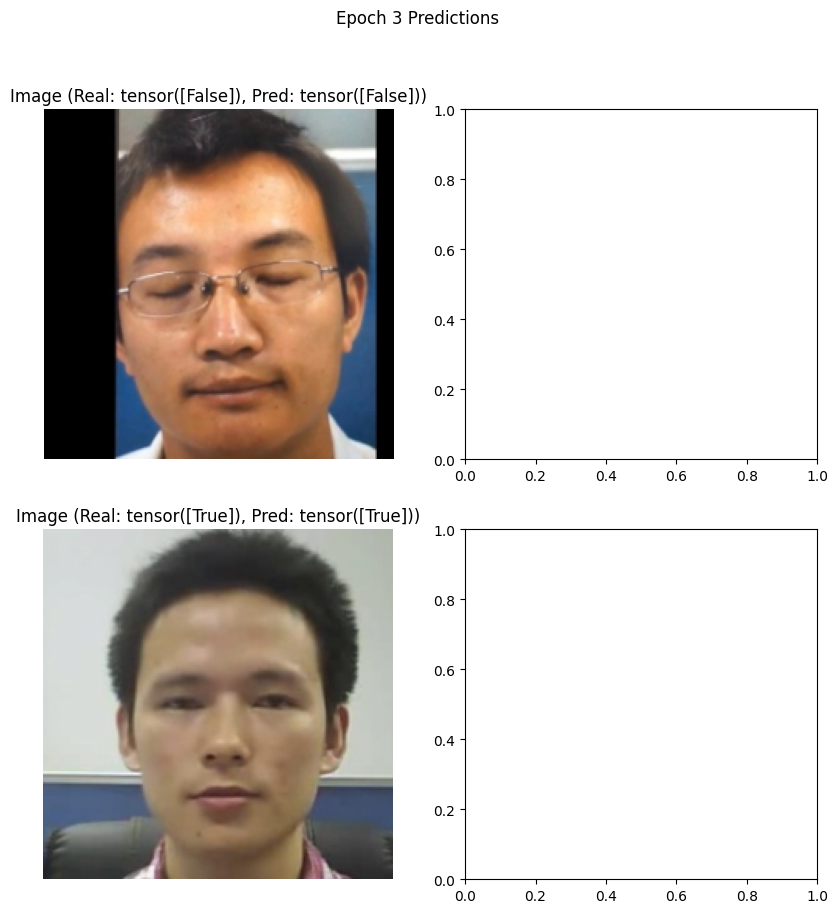

Epoch 4: 100%|██████████| 207/207 [07:02<00:00,  2.04s/it]


Epoch 4 - Loss: 0.0093  Precision: 0.9975  Recall: 0.9975


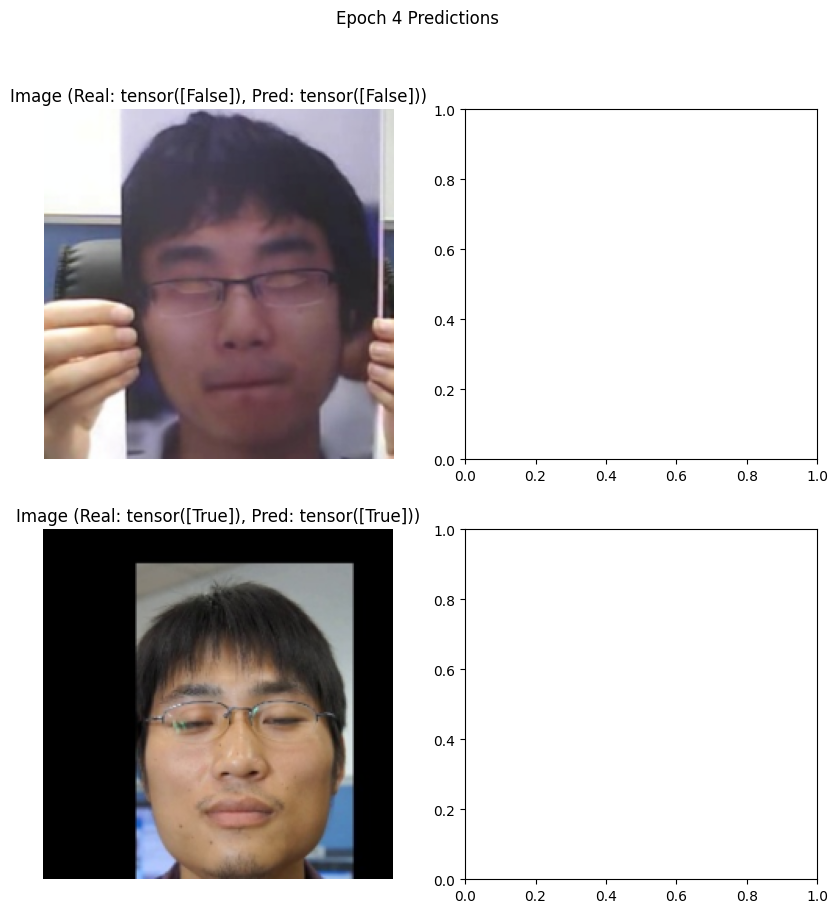

Epoch 5: 100%|██████████| 207/207 [07:24<00:00,  2.15s/it]


Epoch 5 - Loss: 0.0241  Precision: 0.9901  Recall: 0.9901


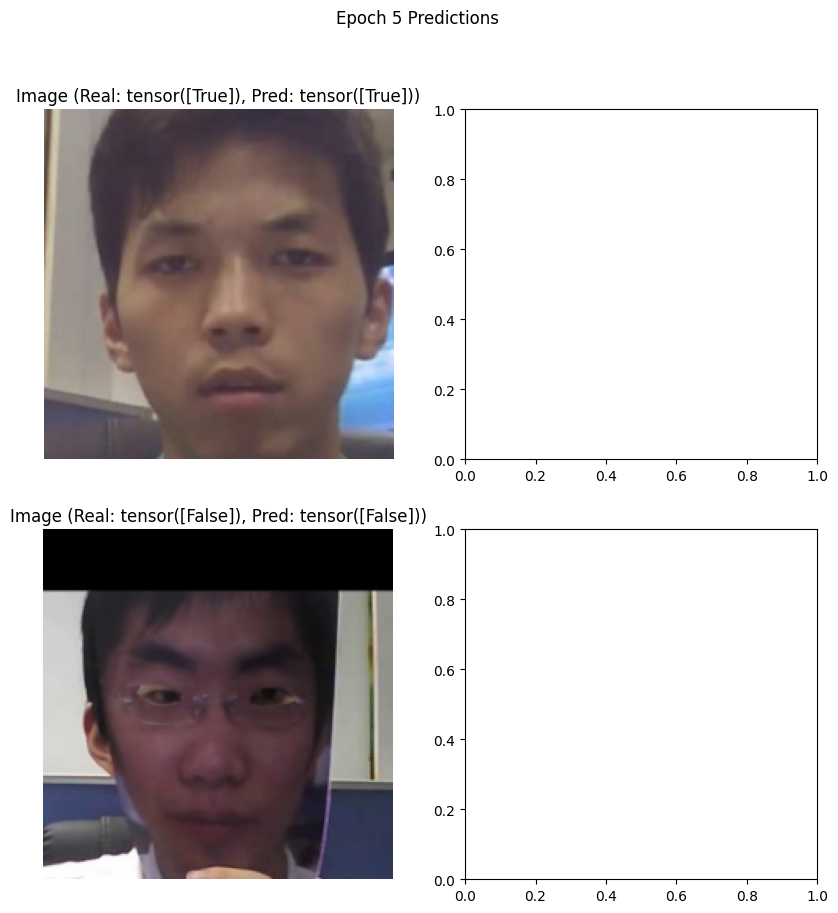

Epoch 6: 100%|██████████| 207/207 [13:05<00:00,  3.79s/it]


Epoch 6 - Loss: 0.0134  Precision: 0.9901  Recall: 0.9950


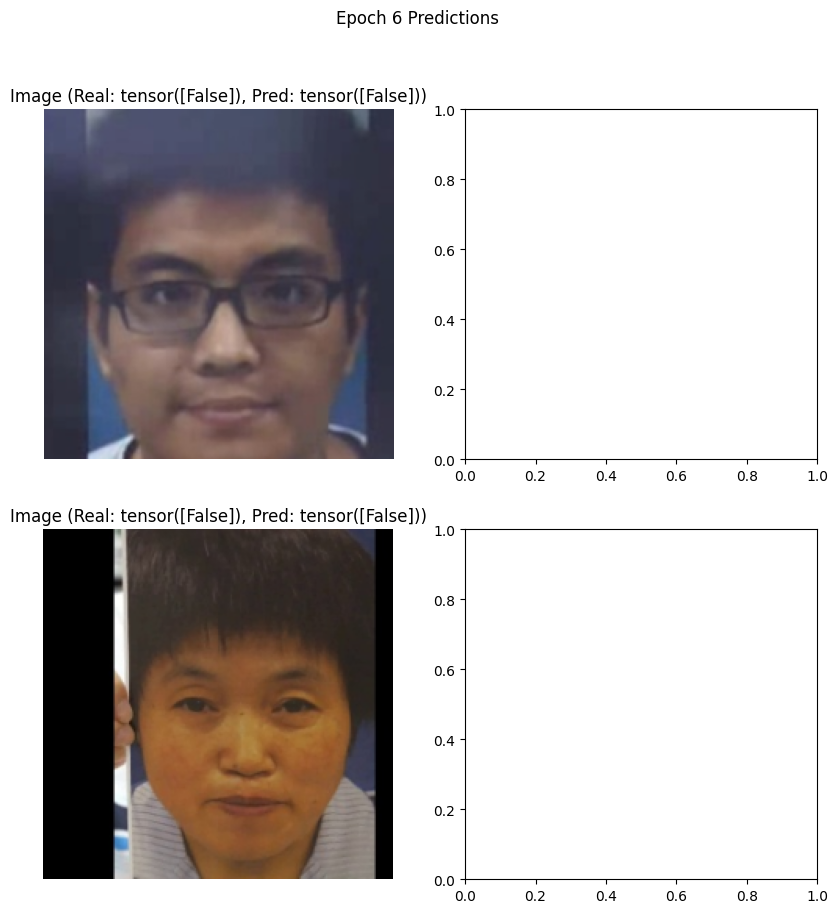

Epoch 7: 100%|██████████| 207/207 [14:36<00:00,  4.24s/it]


Epoch 7 - Loss: 0.0027  Precision: 1.0000  Recall: 0.9975


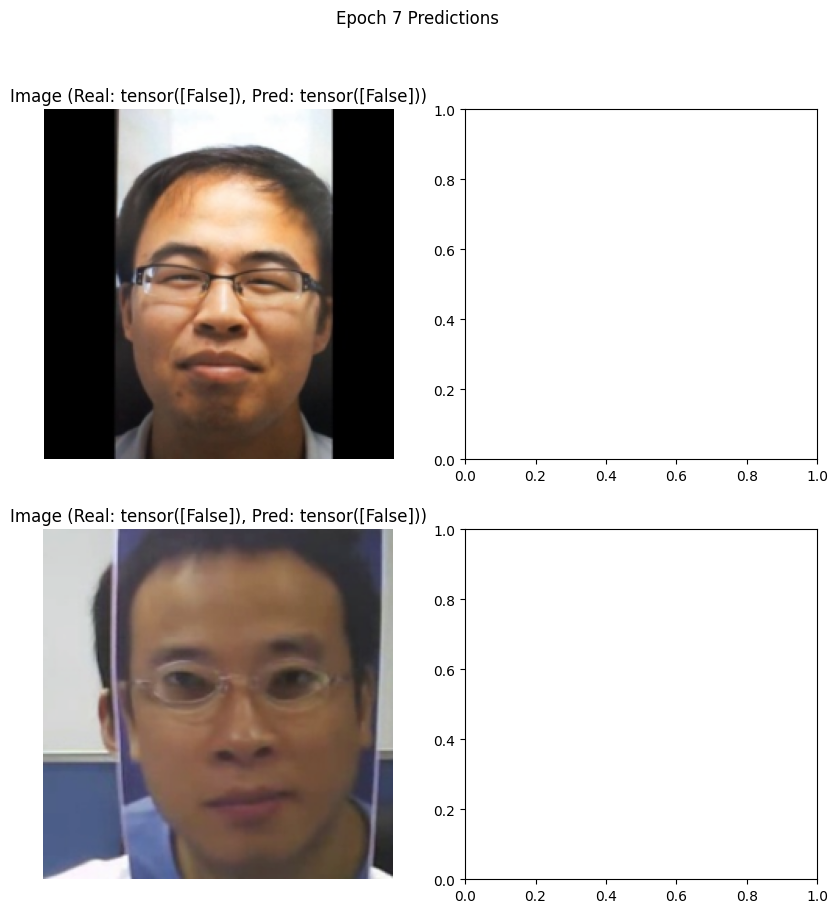

Epoch 8: 100%|██████████| 207/207 [14:44<00:00,  4.27s/it]


Epoch 8 - Loss: 0.0007  Precision: 1.0000  Recall: 1.0000


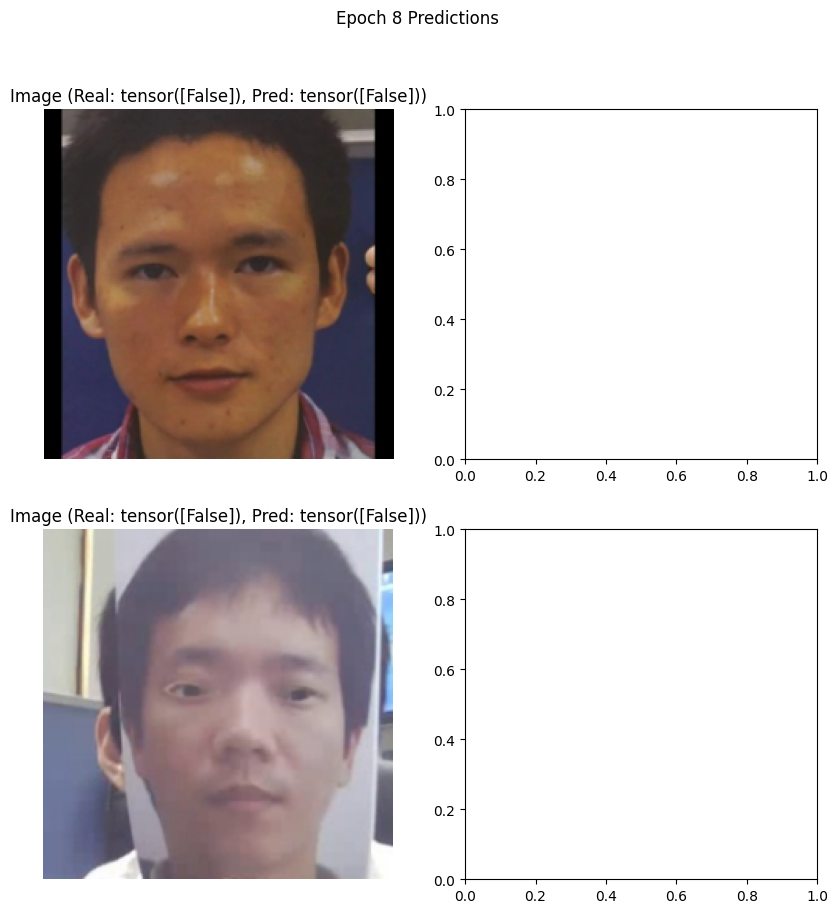

Epoch 9: 100%|██████████| 207/207 [14:39<00:00,  4.25s/it]


Epoch 9 - Loss: 0.0018  Precision: 0.9975  Recall: 1.0000


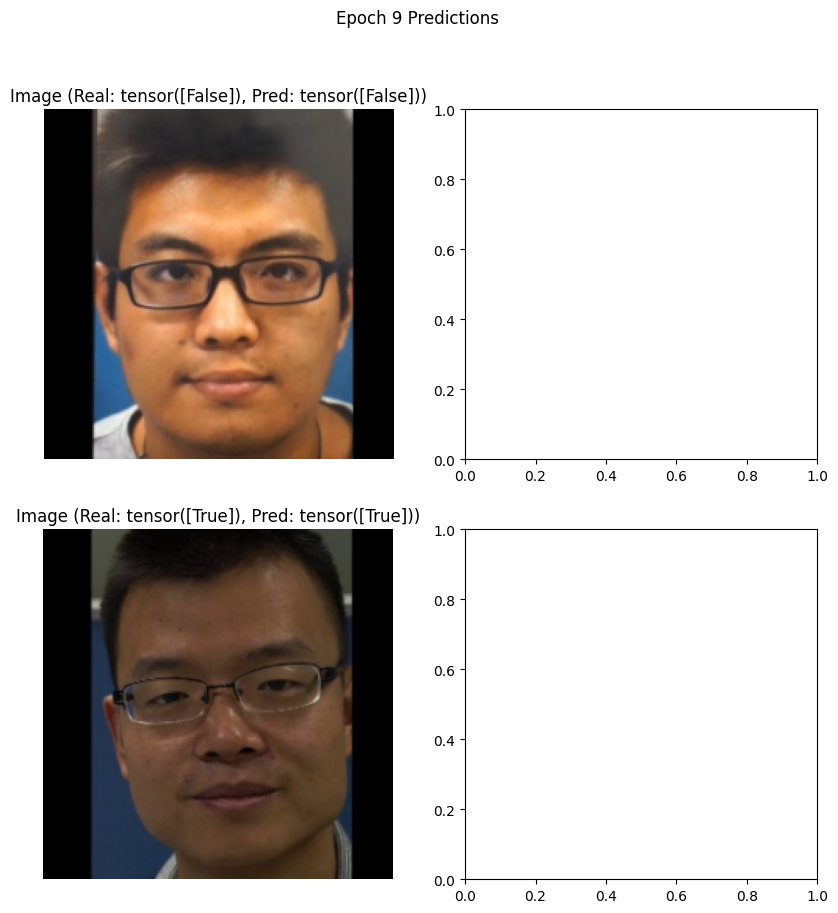

Epoch 10: 100%|██████████| 207/207 [14:41<00:00,  4.26s/it]


Epoch 10 - Loss: 0.0040  Precision: 0.9951  Recall: 0.9975


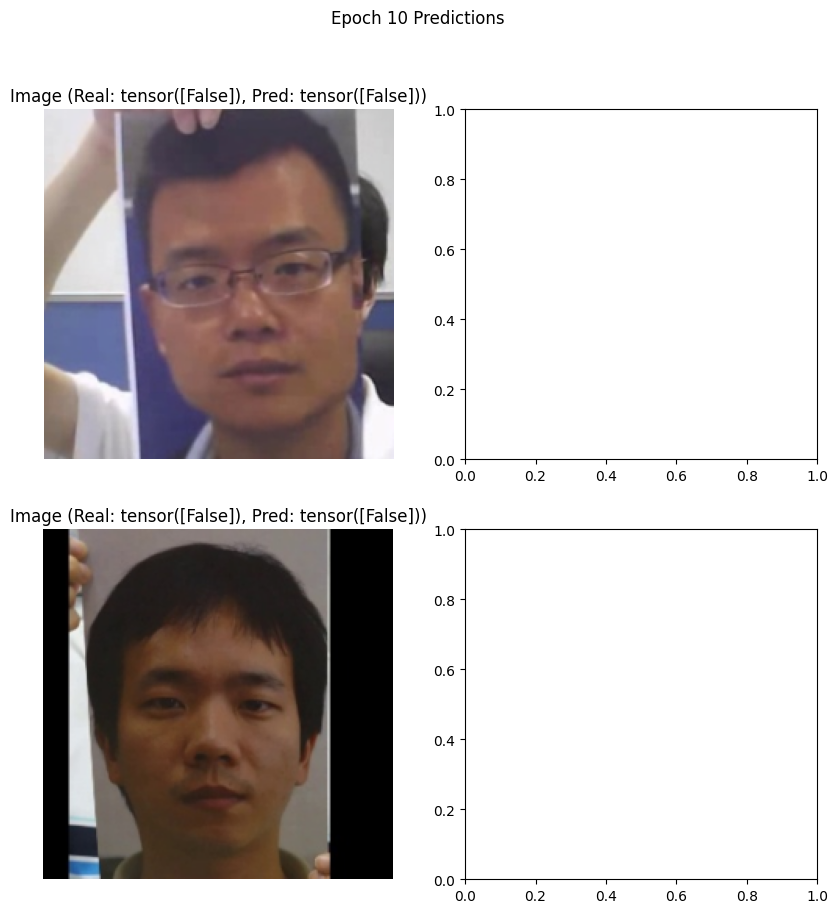

In [ ]:
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score
import numpy as np
from google.colab import drive

# Параметры
IMG_SIZE = 224  # ResNet требует 224x224
BATCH_SIZE = 8
EPOCHS = 10
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'


DATA_PATH = "/content/drive/MyDrive/CASIA-FASD/train_img/color"  # Папка с цветными изображениями
SAVE_MODEL_PATH = "/content/drive/MyDrive/CASIA-FASD/saved_models"
os.makedirs(SAVE_MODEL_PATH, exist_ok=True)

# Трансформация изображений
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Нормализация ImageNet
])

# Класс датасета
class AntiSpoofingDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.files = [f for f in os.listdir(data_dir) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        filename = self.files[idx]
        img_path = os.path.join(self.data_dir, filename)

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Image file not found: {img_path}")

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)

        label = 1.0 if 'real' in filename.lower() else 0.0
        return image, torch.tensor([label], dtype=torch.float32)

# Модель на основе ResNet18
class AntiSpoofingModel(nn.Module):
    def __init__(self, num_classes=1):
        super(AntiSpoofingModel, self).__init__()
        self.resnet = models.resnet18(pretrained=True)
        self.resnet.fc = nn.Sequential(
            nn.Linear(self.resnet.fc.in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.resnet(x)

# Инициализация
model = AntiSpoofingModel().to(DEVICE)
dataset = AntiSpoofingDataset(DATA_PATH, transform=train_transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
criterion = nn.BCELoss()

# Функция для мониторинга предсказаний
def visualize_predictions(images, labels, preds, epoch, num_samples=2):
    model.eval()
    with torch.no_grad():
        preds = (preds > 0.5).float()
        fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))
        for i in range(min(num_samples, images.size(0))):
            # Исходное изображение
            img = images[i].cpu().numpy().transpose((1, 2, 0))
            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Денармализация
            img = np.clip(img, 0, 1)
            axes[i, 0].imshow(img)
            axes[i, 0].set_title(f"Image (Real: {labels[i] > 0.5}, Pred: {preds[i] > 0.5})")
            axes[i, 0].axis('off')
        plt.suptitle(f"Epoch {epoch} Predictions")
        plt.show()
    model.train()

# Обучение
for epoch in range(1, EPOCHS + 1):
    model.train()
    total_loss = 0
    all_labels = []
    all_preds = []

    for images, labels in tqdm(dataloader, desc=f"Epoch {epoch}"):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()
        preds = model(images)
        loss = criterion(preds, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend((preds.detach().cpu().numpy() > 0.5).astype(np.float32))

    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    avg_loss = total_loss / len(dataloader)

    print(f"Epoch {epoch} - Loss: {avg_loss:.4f}  Precision: {precision:.4f}  Recall: {recall:.4f}")
    torch.save(model.state_dict(), os.path.join(SAVE_MODEL_PATH, f"resnet_epoch{epoch}.pth"))

    # Мониторинг предсказаний
    with torch.no_grad():
        preds = model(images.to(DEVICE))
        visualize_predictions(images, labels, preds, epoch)

In [ ]:
!pip uninstall torch torchvision -y
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118

Found existing installation: torch 2.6.0+cu124
Uninstalling torch-2.6.0+cu124:
  Successfully uninstalled torch-2.6.0+cu124
Found existing installation: torchvision 0.21.0+cu124
Uninstalling torchvision-0.21.0+cu124:
  Successfully uninstalled torchvision-0.21.0+cu124
Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 90.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 51.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 109.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cpu


Looking in indexes: https://download.pytorch.org/whl/cpu


In [ ]:
!rm -rf ~/.cache/pip

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 219MB/s]
Epoch 1: 100%|██████████| 207/207 [00:54<00:00,  3.80it/s]


Epoch 1 - Loss: 0.3928  Precision: 0.7756  Recall: 0.3936


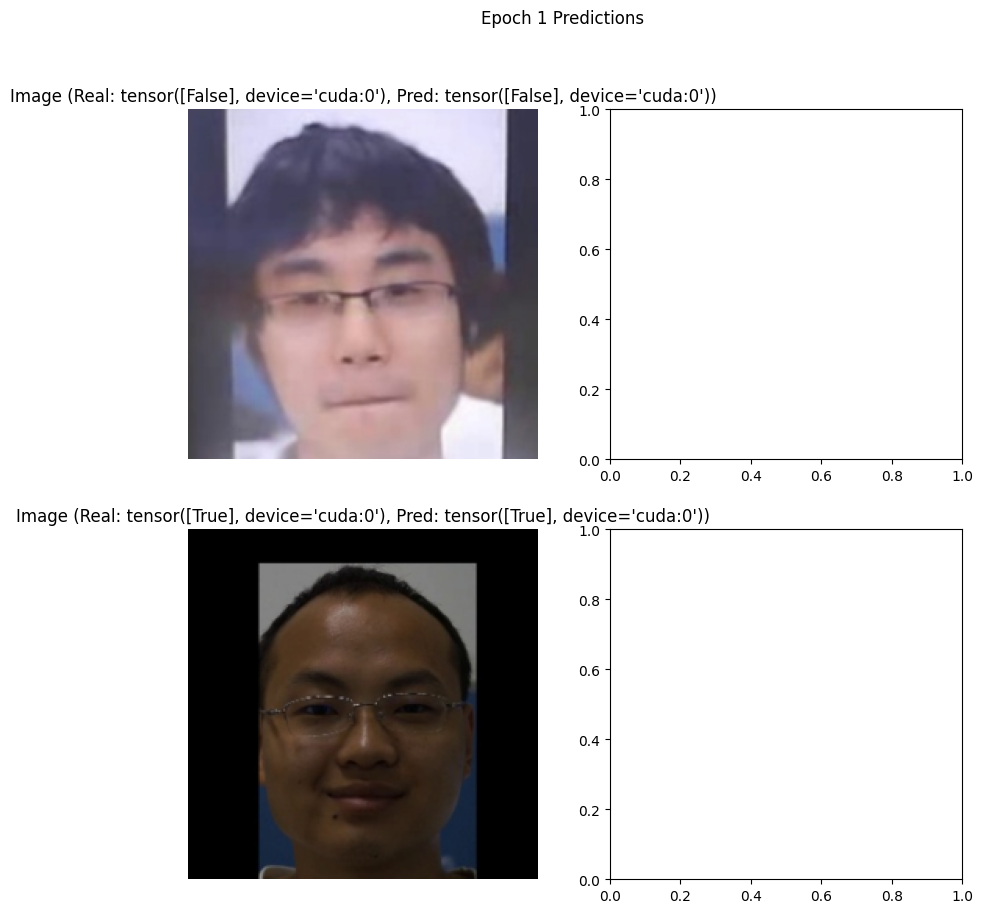

Epoch 2: 100%|██████████| 207/207 [00:16<00:00, 12.65it/s]


Epoch 2 - Loss: 0.2330  Precision: 0.8768  Recall: 0.7574


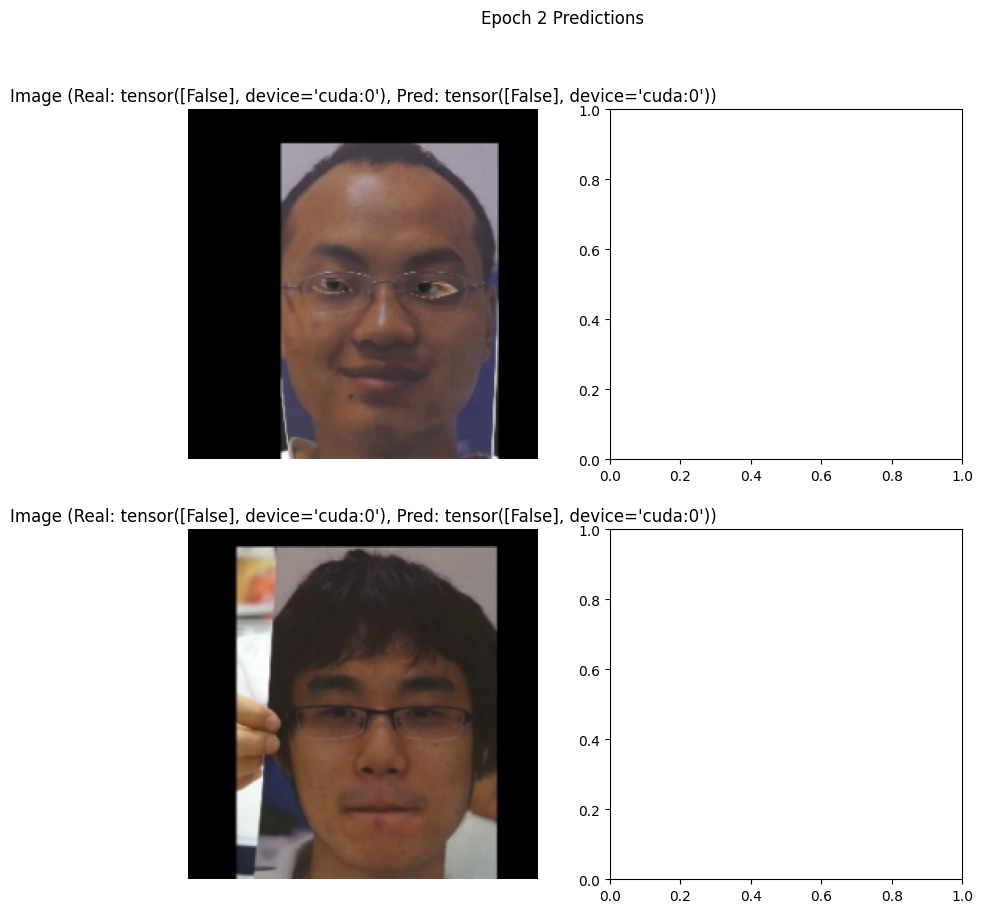

Epoch 3: 100%|██████████| 207/207 [00:16<00:00, 12.82it/s]


Epoch 3 - Loss: 0.1781  Precision: 0.8928  Recall: 0.8243


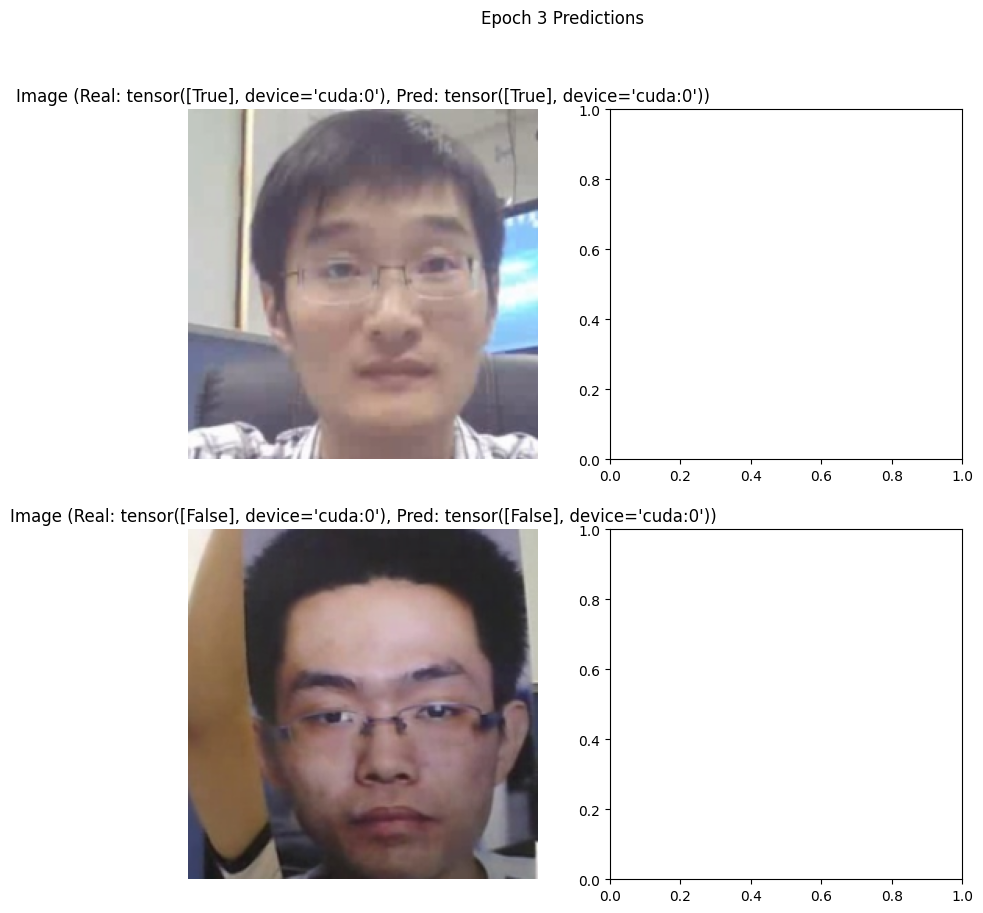

Epoch 4: 100%|██████████| 207/207 [00:15<00:00, 13.18it/s]


Epoch 4 - Loss: 0.1512  Precision: 0.9067  Recall: 0.8416


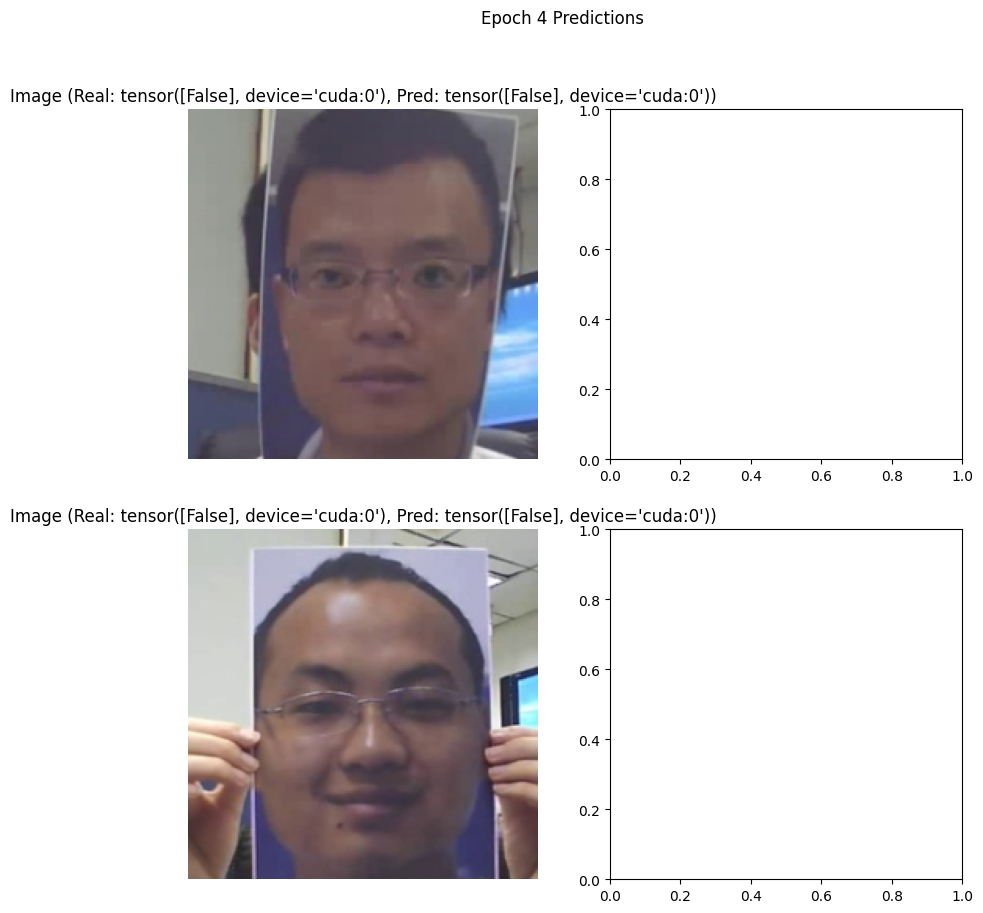

Epoch 5: 100%|██████████| 207/207 [00:16<00:00, 12.87it/s]


Epoch 5 - Loss: 0.1249  Precision: 0.9173  Recall: 0.8787


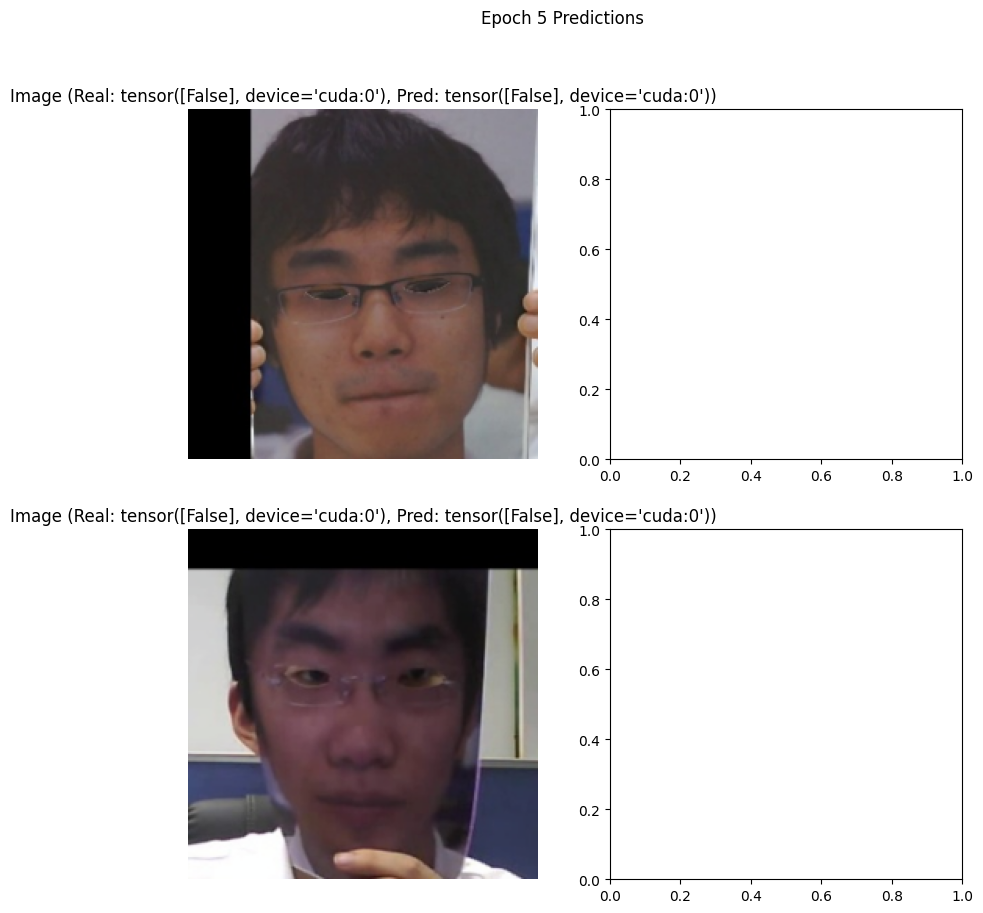

Epoch 6: 100%|██████████| 207/207 [00:15<00:00, 13.15it/s]


Epoch 6 - Loss: 0.1269  Precision: 0.9249  Recall: 0.8837


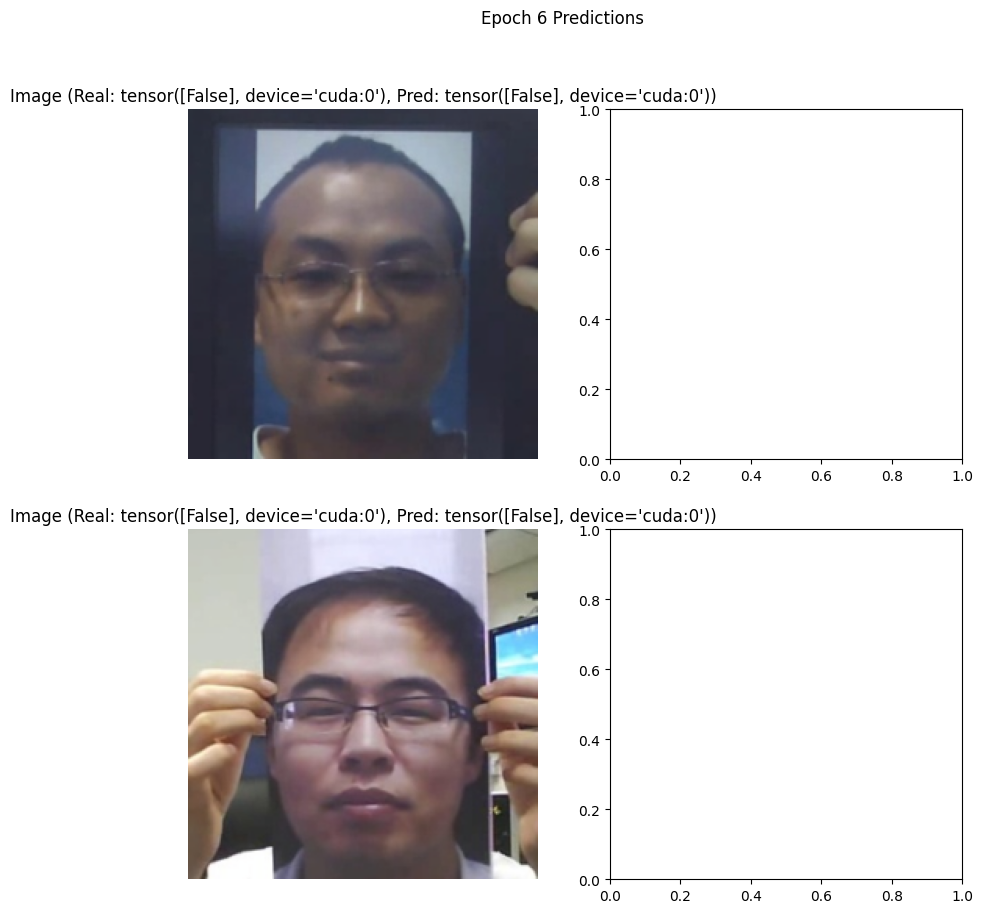

Epoch 7: 100%|██████████| 207/207 [00:16<00:00, 12.70it/s]


Epoch 7 - Loss: 0.0977  Precision: 0.9434  Recall: 0.9084


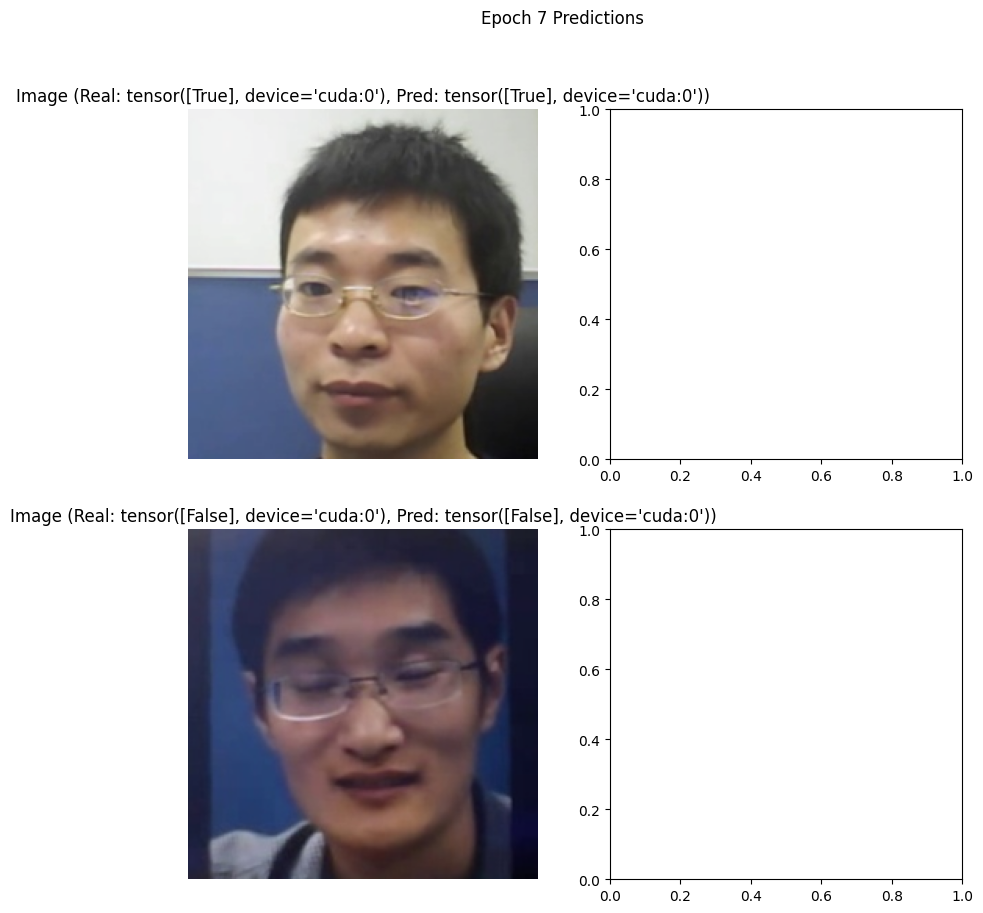

Epoch 8: 100%|██████████| 207/207 [00:16<00:00, 12.72it/s]


Epoch 8 - Loss: 0.1058  Precision: 0.9332  Recall: 0.8985


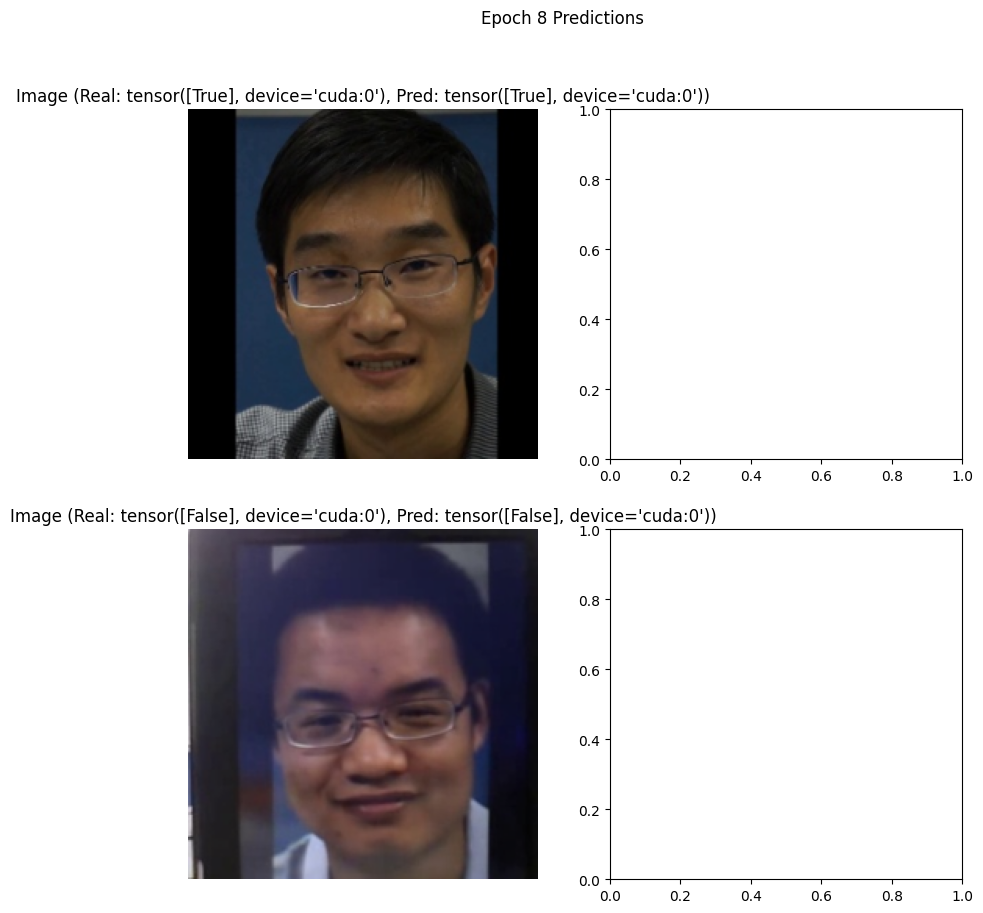

Epoch 9: 100%|██████████| 207/207 [00:16<00:00, 12.90it/s]


Epoch 9 - Loss: 0.1094  Precision: 0.9340  Recall: 0.9109


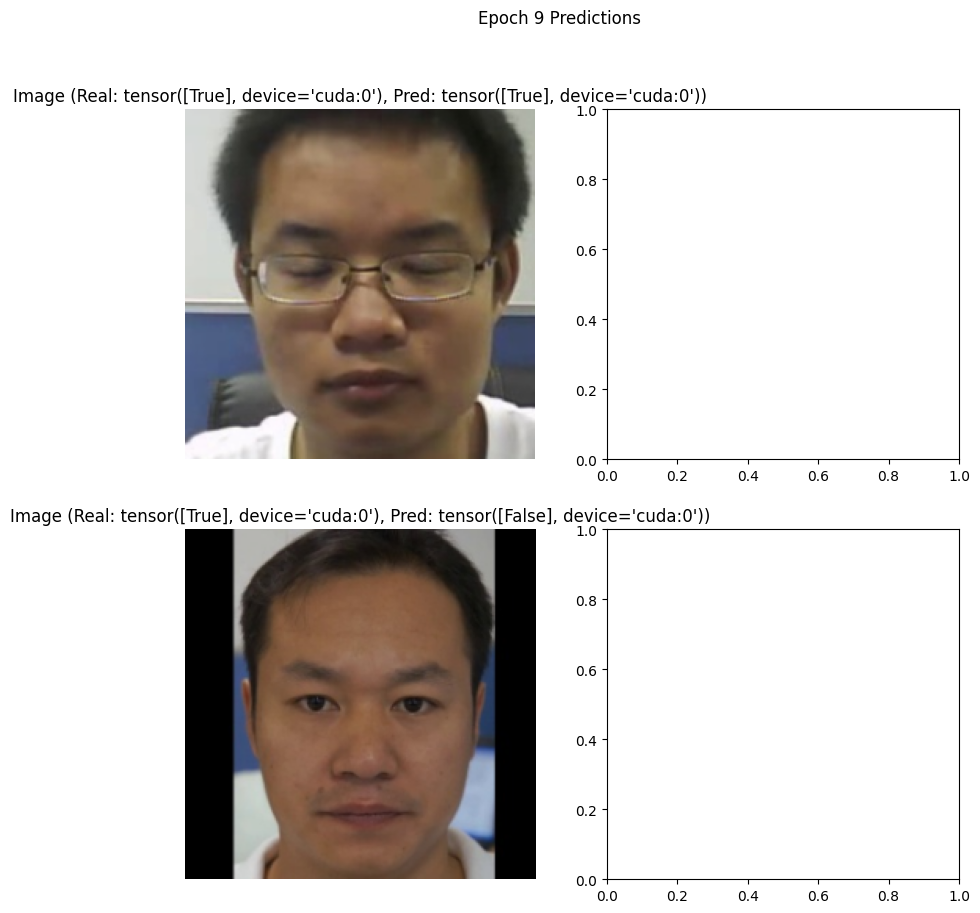

Epoch 10: 100%|██████████| 207/207 [00:16<00:00, 12.65it/s]


Epoch 10 - Loss: 0.1403  Precision: 0.9049  Recall: 0.8713


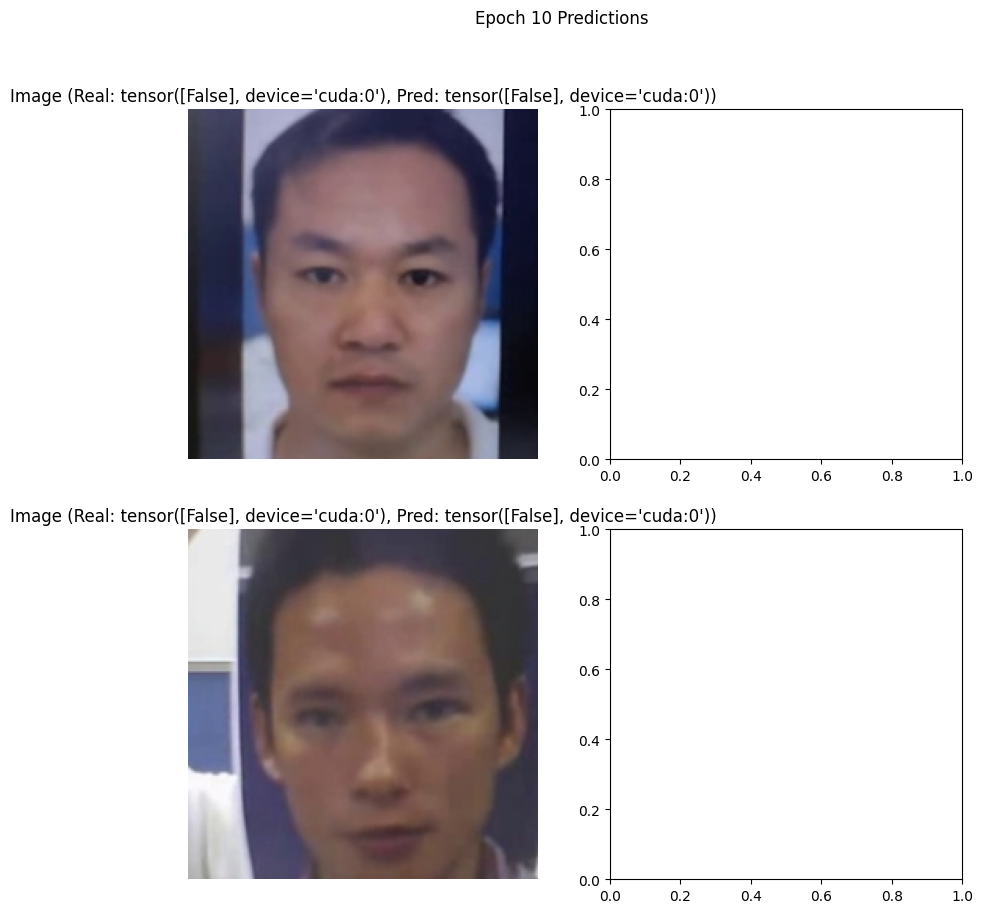

Epoch 11: 100%|██████████| 207/207 [00:16<00:00, 12.91it/s]


Epoch 11 - Loss: 0.1035  Precision: 0.9256  Recall: 0.8936


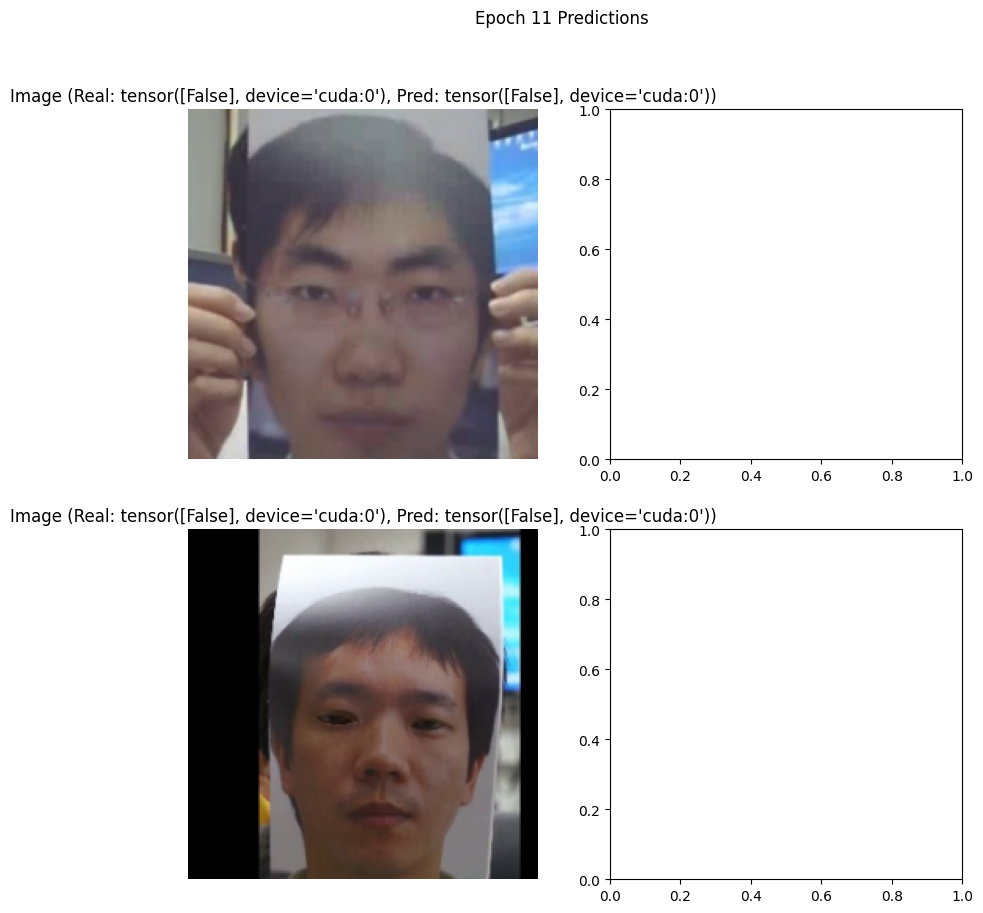

Epoch 12: 100%|██████████| 207/207 [00:16<00:00, 12.26it/s]


Epoch 12 - Loss: 0.0820  Precision: 0.9564  Recall: 0.9233


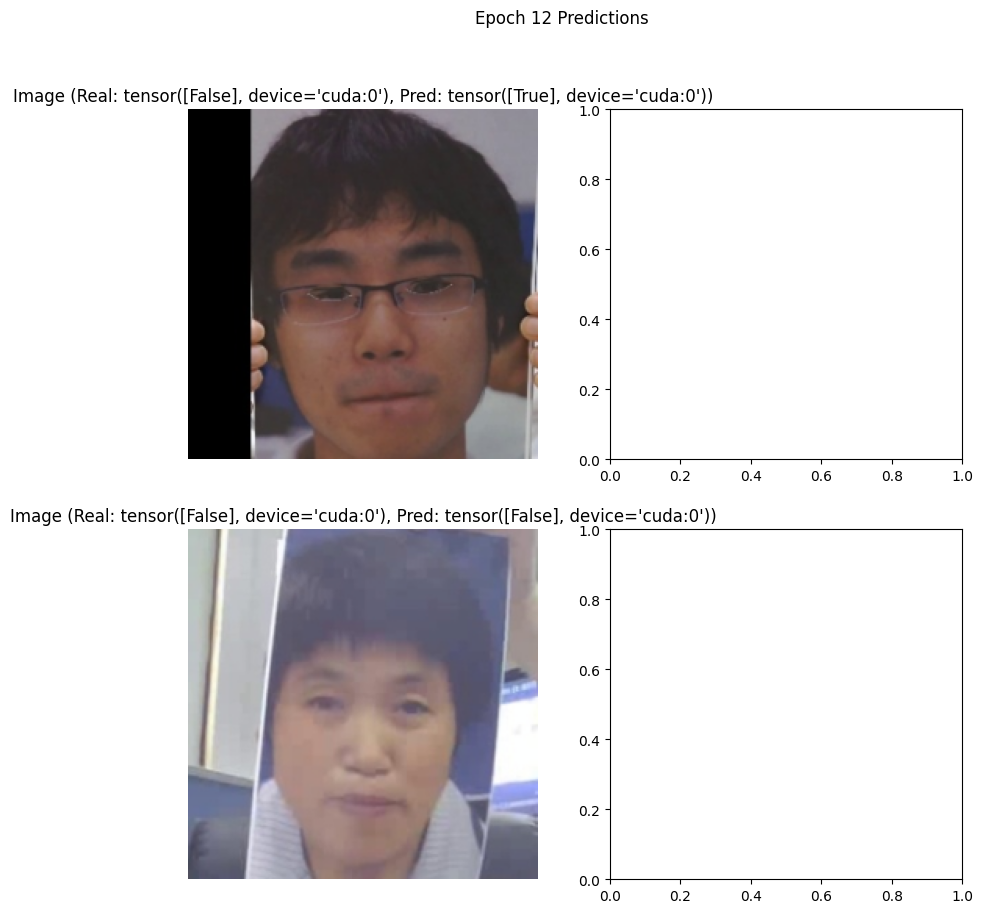

Epoch 13: 100%|██████████| 207/207 [00:16<00:00, 12.60it/s]


Epoch 13 - Loss: 0.0979  Precision: 0.9437  Recall: 0.9134


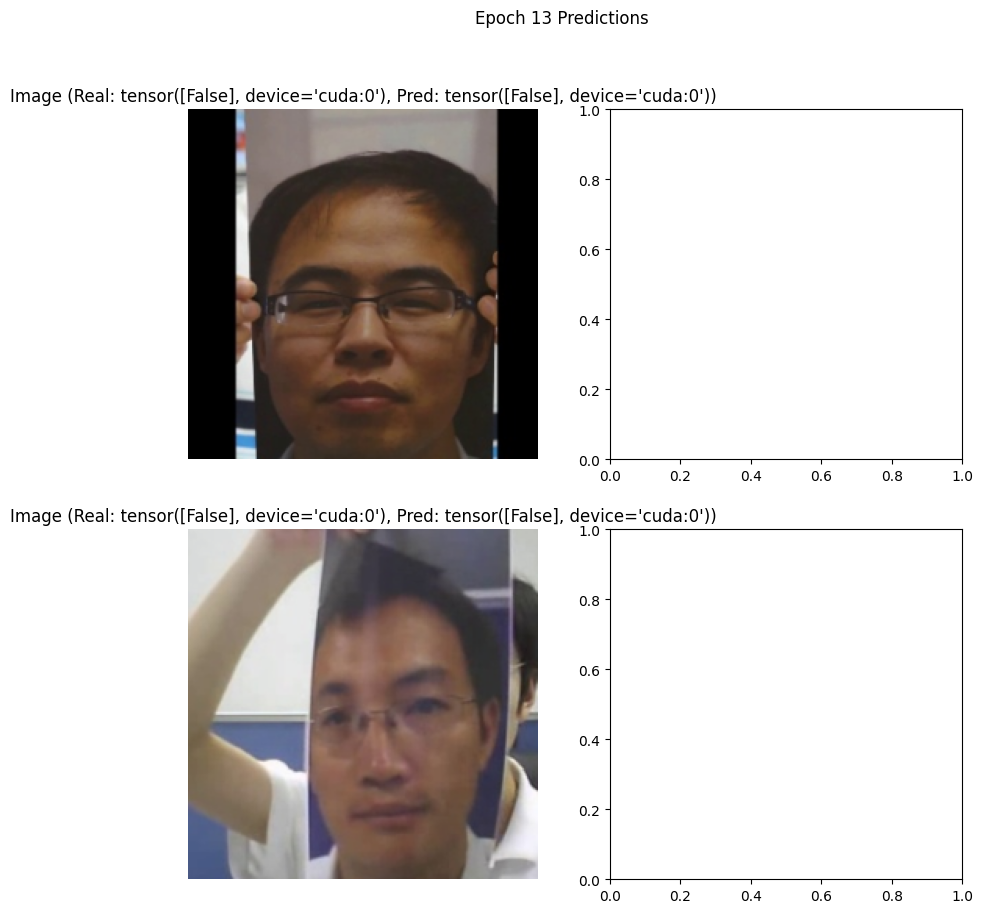

Epoch 14: 100%|██████████| 207/207 [00:16<00:00, 12.53it/s]


Epoch 14 - Loss: 0.0907  Precision: 0.9494  Recall: 0.9282


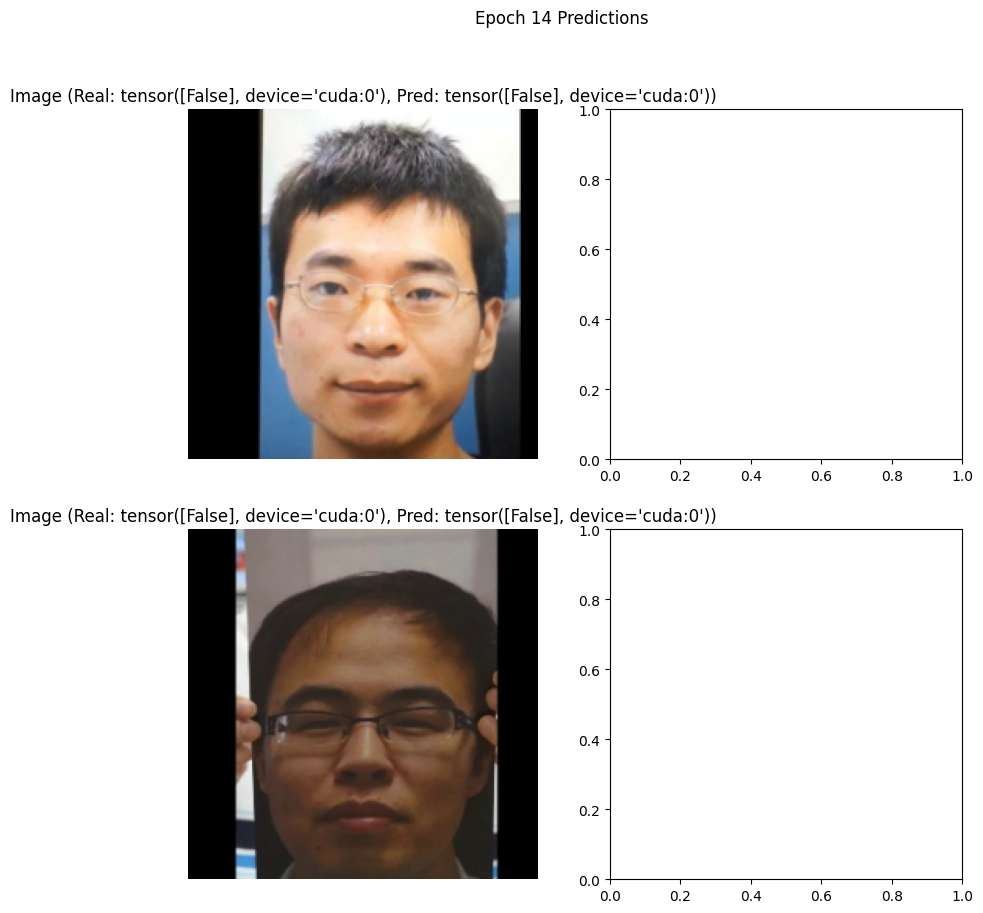

Epoch 15: 100%|██████████| 207/207 [00:16<00:00, 12.51it/s]


Epoch 15 - Loss: 0.1365  Precision: 0.9093  Recall: 0.8688


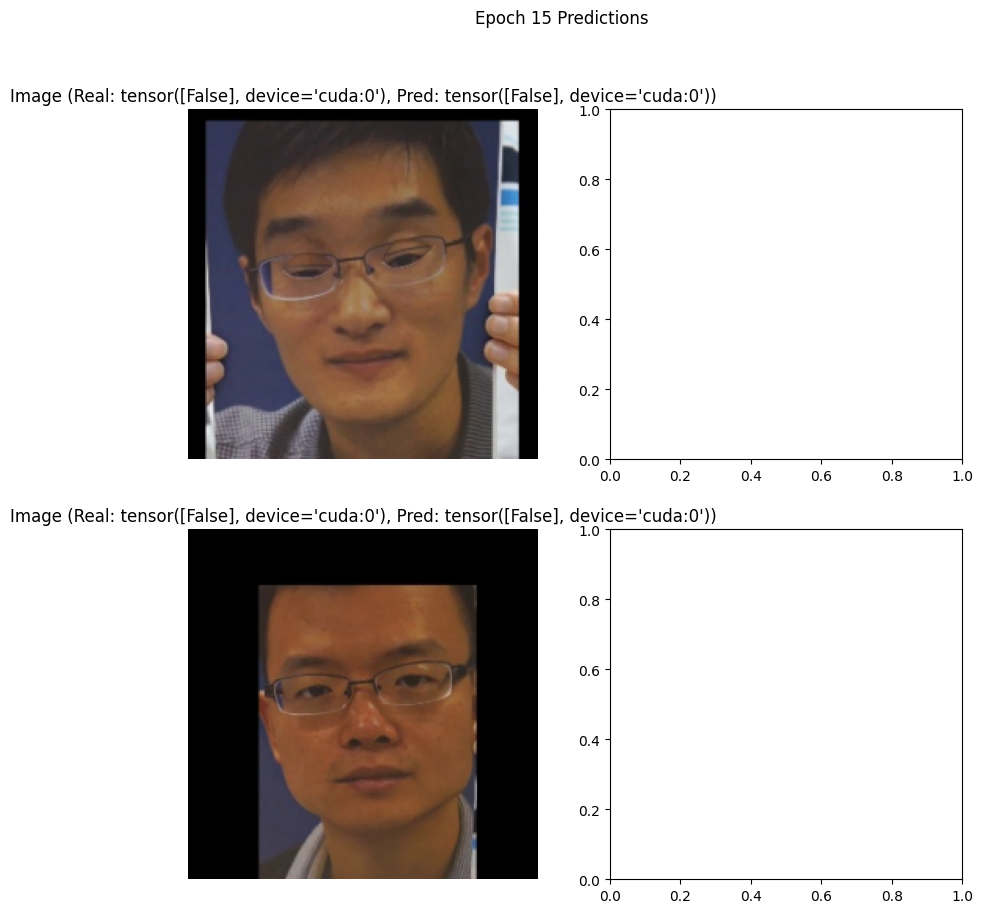

Epoch 16: 100%|██████████| 207/207 [00:16<00:00, 12.22it/s]


Epoch 16 - Loss: 0.0877  Precision: 0.9564  Recall: 0.9233


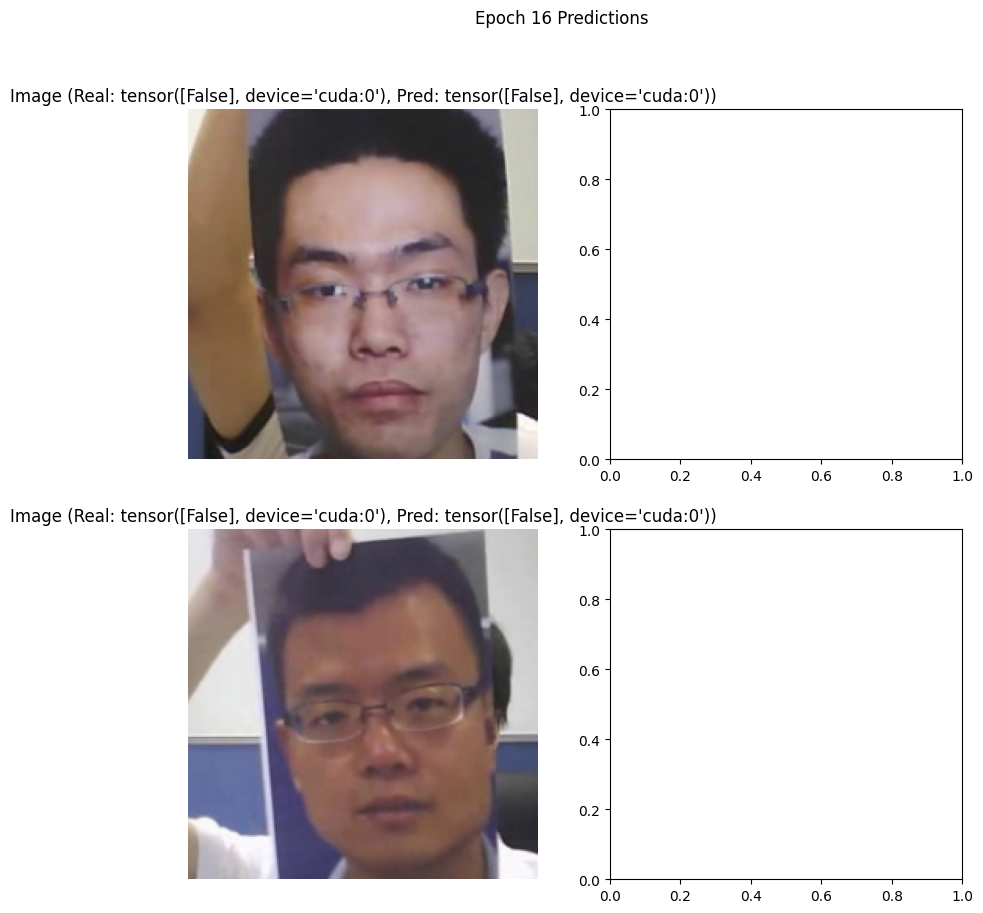

Epoch 17: 100%|██████████| 207/207 [00:17<00:00, 12.03it/s]


Epoch 17 - Loss: 0.0644  Precision: 0.9673  Recall: 0.9530


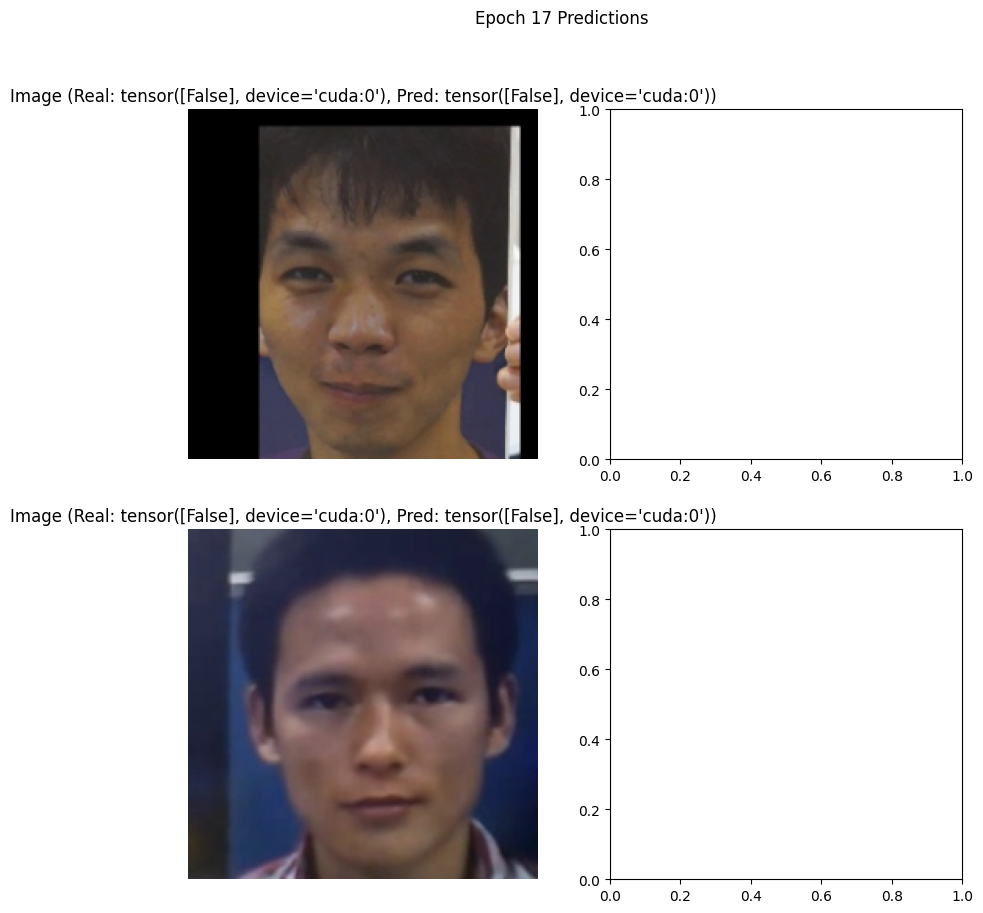

Epoch 18: 100%|██████████| 207/207 [00:16<00:00, 12.46it/s]


Epoch 18 - Loss: 0.0874  Precision: 0.9514  Recall: 0.9208


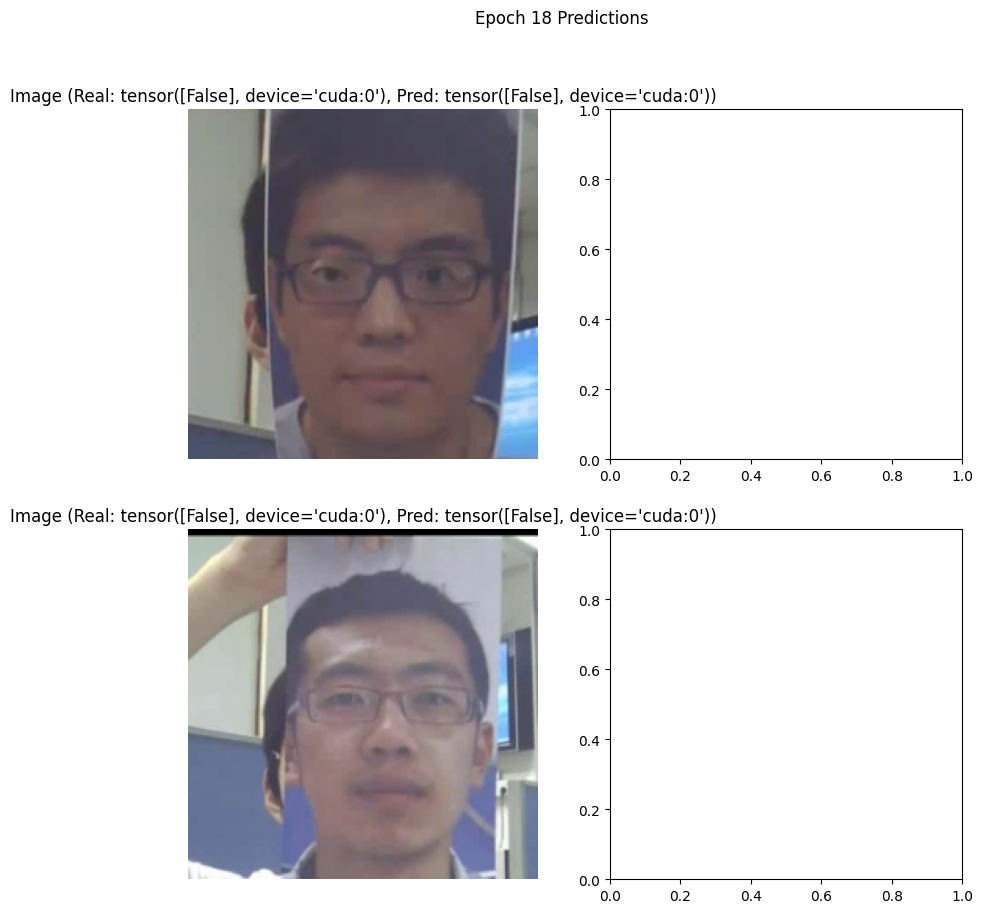

Epoch 19: 100%|██████████| 207/207 [00:16<00:00, 12.54it/s]


Epoch 19 - Loss: 0.0687  Precision: 0.9697  Recall: 0.9505


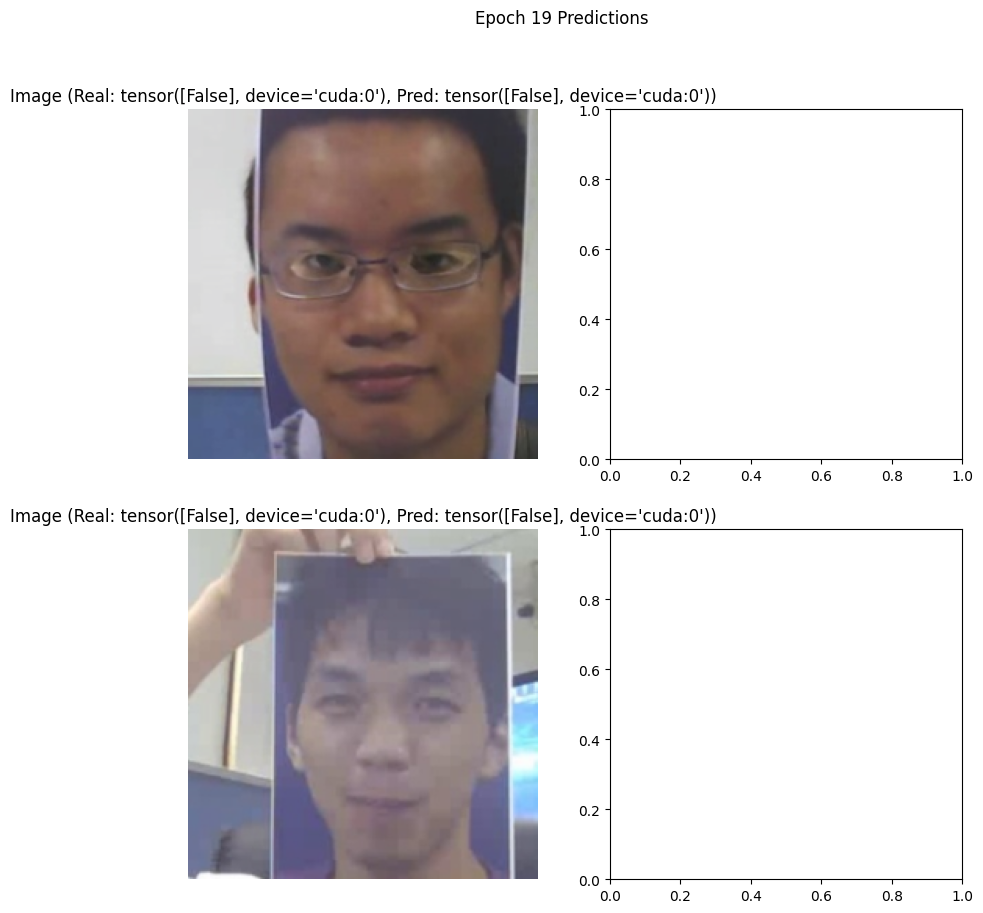

Epoch 20: 100%|██████████| 207/207 [00:16<00:00, 12.41it/s]


Epoch 20 - Loss: 0.1040  Precision: 0.9217  Recall: 0.9035


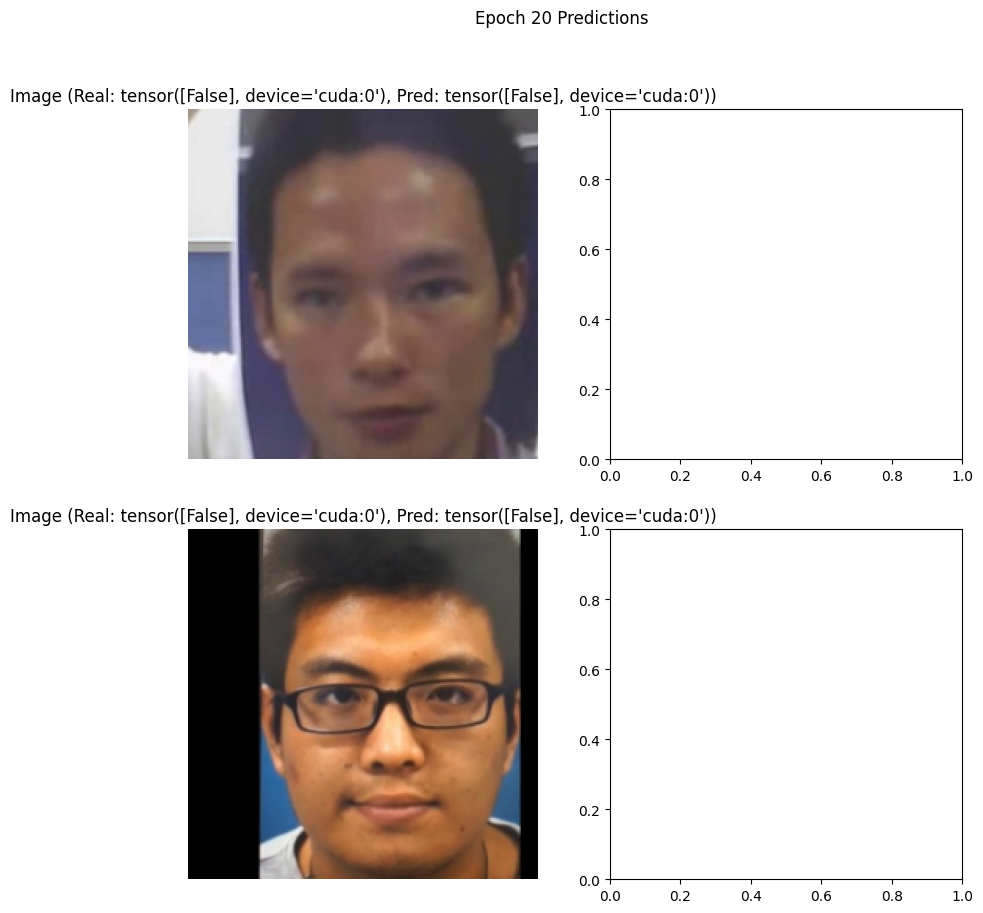

In [ ]:
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score
import numpy as np


# Параметры
IMG_SIZE = 224  # ResNet требует 224x224
BATCH_SIZE = 8
EPOCHS = 20
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Пути к данным

DATA_PATH = "/content/drive/MyDrive/CASIA-FASD/train_img/color"  # Папка с цветными изображениями
SAVE_MODEL_PATH = "/content/drive/MyDrive/CASIA-FASD/saved_models"
os.makedirs(SAVE_MODEL_PATH, exist_ok=True)

# Трансформация изображений
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Нормализация ImageNet
])

# Класс датасета
class AntiSpoofingDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.files = [f for f in os.listdir(data_dir) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        filename = self.files[idx]
        img_path = os.path.join(self.data_dir, filename)

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Image file not found: {img_path}")

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)

        label = 1.0 if 'real' in filename.lower() else 0.0
        return image, torch.tensor([label], dtype=torch.float32)

# Модель с замороженными слоями
class AntiSpoofingModel(nn.Module):
    def __init__(self, num_classes=1):
        super(AntiSpoofingModel, self).__init__()
        self.resnet = models.resnet18(pretrained=True)

        # Замораживаем все слои кроме последнего
        for param in self.resnet.parameters():
            param.requires_grad = False

        # Заменяем финальный слой классификации
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Linear(num_features, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.resnet(x)

# Инициализация
model = AntiSpoofingModel().to(DEVICE)
dataset = AntiSpoofingDataset(DATA_PATH, transform=train_transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

optimizer = optim.Adam(model.resnet.fc.parameters(), lr=1e-3)  # Обучаем только классификатор
criterion = nn.BCELoss()

# Функция для мониторинга предсказаний
def visualize_predictions(images, labels, preds, epoch, num_samples=2):
    model.eval()
    with torch.no_grad():
        preds = (preds > 0.5).float()
        fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))
        for i in range(min(num_samples, images.size(0))):
            # Исходное изображение
            img = images[i].cpu().numpy().transpose((1, 2, 0))
            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Денармализация
            img = np.clip(img, 0, 1)
            axes[i, 0].imshow(img)
            axes[i, 0].set_title(f"Image (Real: {labels[i] > 0.5}, Pred: {preds[i] > 0.5})")
            axes[i, 0].axis('off')
        plt.suptitle(f"Epoch {epoch} Predictions")
        plt.show()
    model.train()

# Обучение
for epoch in range(1, EPOCHS + 1):
    model.train()
    total_loss = 0
    all_labels = []
    all_preds = []

    for images, labels in tqdm(dataloader, desc=f"Epoch {epoch}"):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()
        preds = model(images)
        loss = criterion(preds, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend((preds.detach().cpu().numpy() > 0.5).astype(np.float32))

    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    avg_loss = total_loss / len(dataloader)

    print(f"Epoch {epoch} - Loss: {avg_loss:.4f}  Precision: {precision:.4f}  Recall: {recall:.4f}")
    torch.save(model.state_dict(), os.path.join(SAVE_MODEL_PATH, f"resnet_classifier_epoch{epoch}.pth"))

    # Мониторинг предсказаний
    with torch.no_grad():
        preds = model(images.to(DEVICE))
        visualize_predictions(images, labels, preds, epoch)